In [2]:

import warnings
import numpy as np
# import pandas as pd
import scanpy as sc
import scipy
import featuremap

sc.logging.print_header()
sc.settings.set_figure_params(dpi=120, facecolor='white')

warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=FutureWarning)

# ignore  DeprecationWarning
warnings.simplefilter("ignore", category=DeprecationWarning)

scanpy==1.9.8 anndata==0.10.5.post1 umap==0.5.4 numpy==1.23.5 scipy==1.12.0 pandas==2.2.1 scikit-learn==1.2.2 statsmodels==0.14.0 igraph==0.11.4 louvain==0.8.0 pynndescent==0.5.11


# FeatureMAP on Pancreatic development data
In this tutorial,  we apply the FeatureMAP tool to a dataset from murine embryonic pancreatic development, specifically on day 15.5 of the embryo's development (E15.5). The original research using this dataset successfully identified various cell clusters and delineated the key developmental trajectories leading to alpha, beta, epsilon, and delta cell states. However, our findings suggest that FeatureMAP provides a more accurate representation of these developmental pathways, especially in precisely tracing the lineage patterns of alpha and beta cells.
1. GEX and GVA visualization
2. Transition and core states identification
3. DGV to indentify important genes
4. Gene contribution visualization


## Preprocessing


In [3]:
# Downlowd the data
# Datasets
_datasets = {
    "pancreas": ("https://figshare.com/ndownloader/files/25060877", (2531, 27998)),
}
import os
dataset = 'pancreas'
filepath = f'datasets/{dataset}.h5ad'
# Check if the data is already downloaded
if not os.path.exists(filepath):
    print(f'Downloading {dataset} dataset...')
    # Download the preprocessed pancreas dataset
    adata = sc.read(filename=filepath, backup_url=_datasets[dataset][0])
else:
    adata = sc.read(filepath)

    
# Preprocessing
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=3)
# Normalizing to median total counts
sc.pp.normalize_total(adata)
# Logarithmize the data
sc.pp.log1p(adata)

# Highly variable genes
sc.pp.highly_variable_genes(adata, n_top_genes=2000)
adata = adata[:, adata.var.highly_variable]


In [4]:
adata

View of AnnData object with n_obs × n_vars = 2531 × 2000
    obs: 'day', 'proliferation', 'G2M_score', 'S_score', 'phase', 'clusters_coarse', 'clusters', 'clusters_fine', 'louvain_Alpha', 'louvain_Beta', 'palantir_pseudotime', 'n_genes'
    var: 'highly_variable_genes', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'clusters_colors', 'clusters_fine_colors', 'louvain_Alpha_colors', 'louvain_Beta_colors', 'neighbors', 'pca', 'log1p', 'hvg'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

## FeatureMAP GEX and GVA visualization

We first show UMAP embedding as baseline.

Performing SVD decomposition on the data
The history saving thread hit an unexpected error (OperationalError('database is locked')).History will not be written to the database.


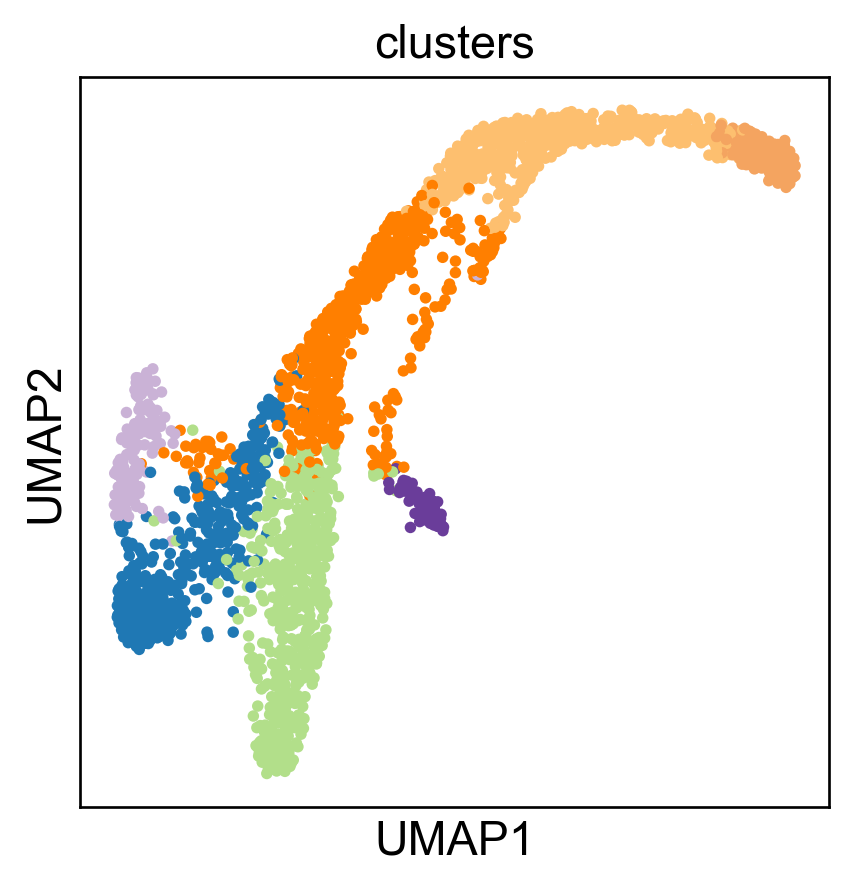

In [6]:
import umap
from featuremap.featuremap_ import _preprocess_data

data = adata.X.copy()
emb_svd, vh = _preprocess_data(data)

emb_umap = umap.UMAP(n_neighbors=30, random_state=42, min_dist=0.3).fit(emb_svd)

adata.obsm['X_umap'] = emb_umap.embedding_
sc.pl.embedding(adata, basis='umap', color='clusters', legend_loc='none')

Here is our FeatureMAP-GEX embedding.

In [7]:
from featuremap.featuremap_ import _preprocess_data

data = adata.X.copy()

emb_svd, vh = _preprocess_data(data)
data = emb_svd

emb_featuremap = featuremap.FeatureMAP(
                    random_state=42,
                    output_variation=False,
                    output_feat=True,
                    verbose=True,
                    ).fit(data)

Performing SVD decomposition on the data
FeatureMAP(output_feat=True, random_state=42, verbose=True)
Wed Feb  5 15:04:46 2025 Construct fuzzy simplicial set
Wed Feb  5 15:04:46 2025 Finding Nearest Neighbors
Wed Feb  5 15:04:46 2025 Building RP forest with 8 trees
Wed Feb  5 15:04:50 2025 NN descent for 11 iterations
	 1  /  11
	 2  /  11
	 3  /  11
	Stopping threshold met -- exiting after 3 iterations
Wed Feb  5 15:05:01 2025 Finished Nearest Neighbor Search
Wed Feb  5 15:05:02 2025 Construct embedding
Wed Feb  5 15:05:02 2025 Computing tangent space
Wed Feb  5 15:05:11 2025 Local SVD time is 9.377881050109863
Wed Feb  5 15:05:12 2025 Average over 5 times
Applying graph convolution for 5 iterations...
Graph convolution completed in 2.93 seconds
Wed Feb  5 15:05:15 2025 Tangent_space_approximation time is 12.476336002349854
k is 14
Wed Feb  5 15:05:24 2025 Tangent space embedding
Wed Feb  5 15:05:24 2025 Start optimizing layout


Epochs completed: 100%| ██████████ 600/600 [00:31]


Wed Feb  5 15:05:56 2025 Optimize layout time is 31.522729873657227
Wed Feb  5 15:05:56 2025 Computing expression embedding densities
Wed Feb  5 15:05:57 2025 Embedding radii computation time is 1.0708448886871338
Wed Feb  5 15:05:57 2025 Finished embedding


/Users/uqyyao4/Documents/Project/03_Gradient_preserving_Manifold_Approximation_and_Projection/code/FeatureMAP/featuremap/featuremap_.py:1100: RuntimeWarning: invalid value encountered in sqrt
  featuremap_kwds["re_sum"] = np.sqrt(re_sum) # Variance of Gaussian distribution


mu is not added to adata


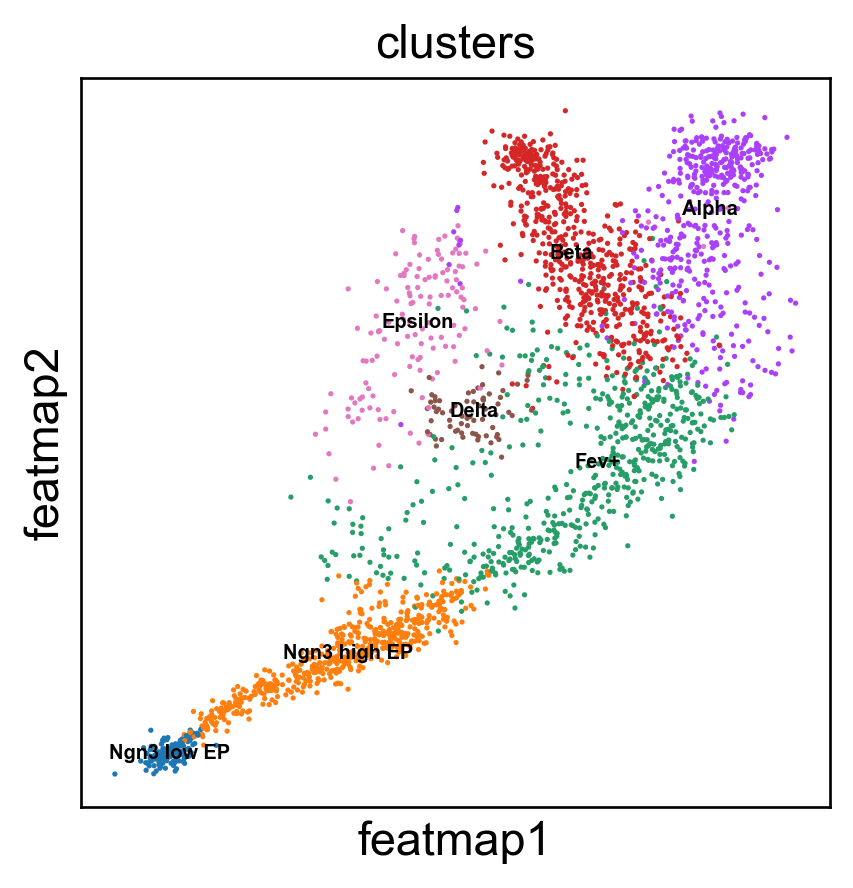

In [8]:
# plot the embedding
from featuremap import features
adata = features.create_adata(X=adata.X.copy(), emb_featuremap=emb_featuremap, obs=adata.obs.copy(), var=adata.var.copy())
adata.obsm['X_svd'] = emb_svd
adata.varm['svd_vh'] = vh.T

adata.obsm['X_umap'] = emb_umap.embedding_

sc.pl.embedding(adata, 'featmap',legend_fontsize=6, s=10, legend_loc='on data', color=['clusters'])


Gene variation embedding

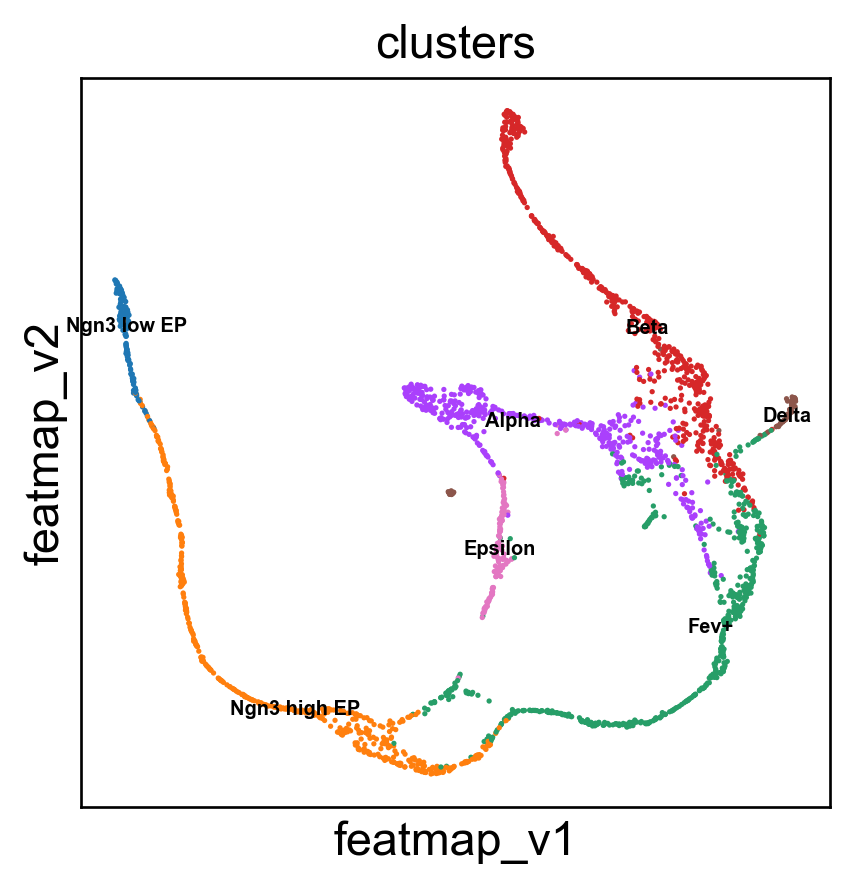

In [9]:
# Variation embedding
data = adata.obsm['X_svd'].copy()
emb_featuremap_v = featuremap.FeatureMAP(random_state=42, output_variation=True,threshold=0.9, min_dist=0.3).fit(data)

adata.obsm['X_featmap_v'] = emb_featuremap_v.embedding_
sc.pl.embedding(adata, 'featmap_v',legend_fontsize=6, s=10, legend_loc='on data', color=['clusters'])

adata.obsm['variation_pc'] = emb_featuremap_v._featuremap_kwds['variation_pc']


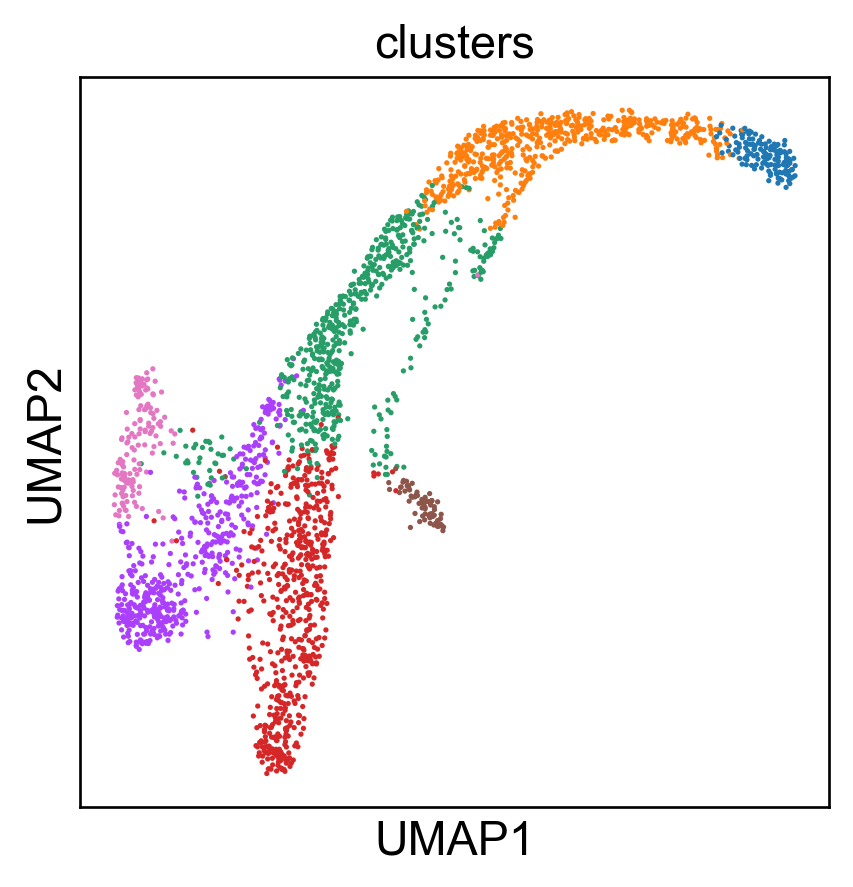

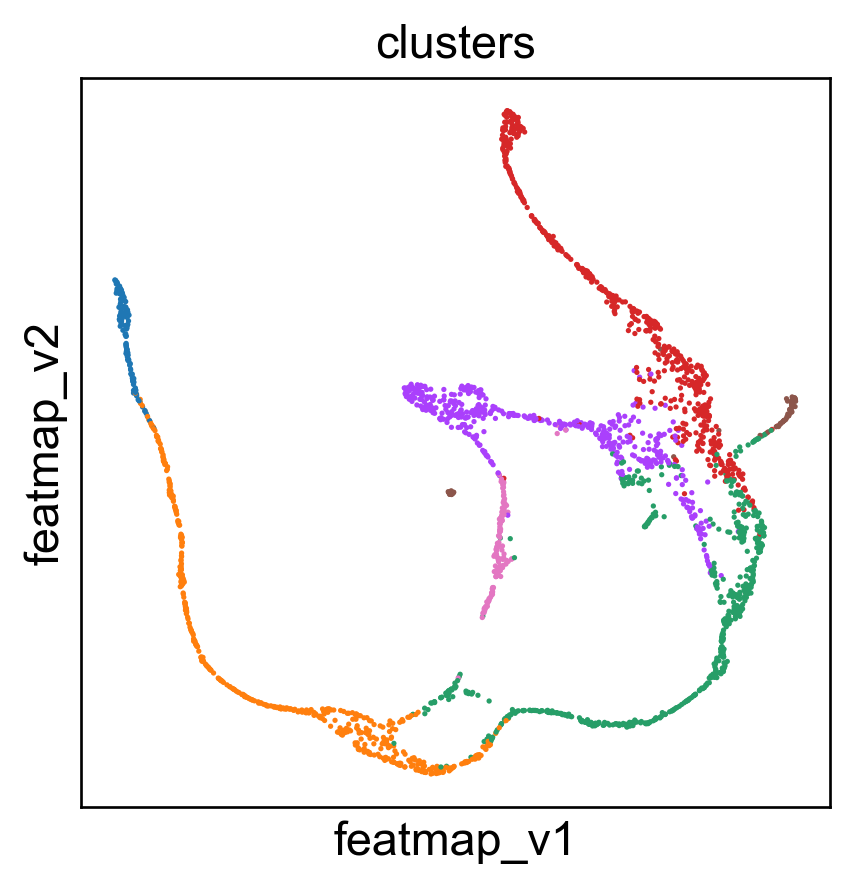

In [10]:
sc.pl.embedding(adata, 'umap',legend_fontsize=6, s=10, legend_loc='none', color=['clusters'])
sc.pl.embedding(adata, 'featmap_v',legend_fontsize=6, s=10, legend_loc='none', color=['clusters'])

3D embedding

In [11]:
data = adata.obsm['X_svd'].copy()
from featuremap import featuremap_
emb_featuremap_3d = featuremap_.FeatureMAP(n_components=3,random_state=42,output_variation=True,).fit_transform(data)

adata.obsm['X_featmap_v_3d'] = emb_featuremap_3d


In [12]:

from featuremap import features
import importlib
importlib.reload(features)

features.featuremap_var_3d(emb_featuremap_3d, color=adata.obs['clusters'])

Benchmark with PHATE, t-SNE and densMAP.

Running PHATE on 2531 observations and 100 variables.
Calculating graph and diffusion operator...
  Calculating KNN search...
  Calculated KNN search in 0.67 seconds.
  Calculating affinities...
  Calculated affinities in 0.03 seconds.
Calculated graph and diffusion operator in 0.70 seconds.
Calculating landmark operator...
  Calculating SVD...
  Calculated SVD in 0.31 seconds.
  Calculating KMeans...
  Calculated KMeans in 8.65 seconds.
Calculated landmark operator in 10.70 seconds.
Calculating optimal t...
  Automatically selected t = 12
Calculated optimal t in 15.95 seconds.
Calculating diffusion potential...
Calculated diffusion potential in 13.99 seconds.
Calculating metric MDS...
Calculated metric MDS in 6.70 seconds.


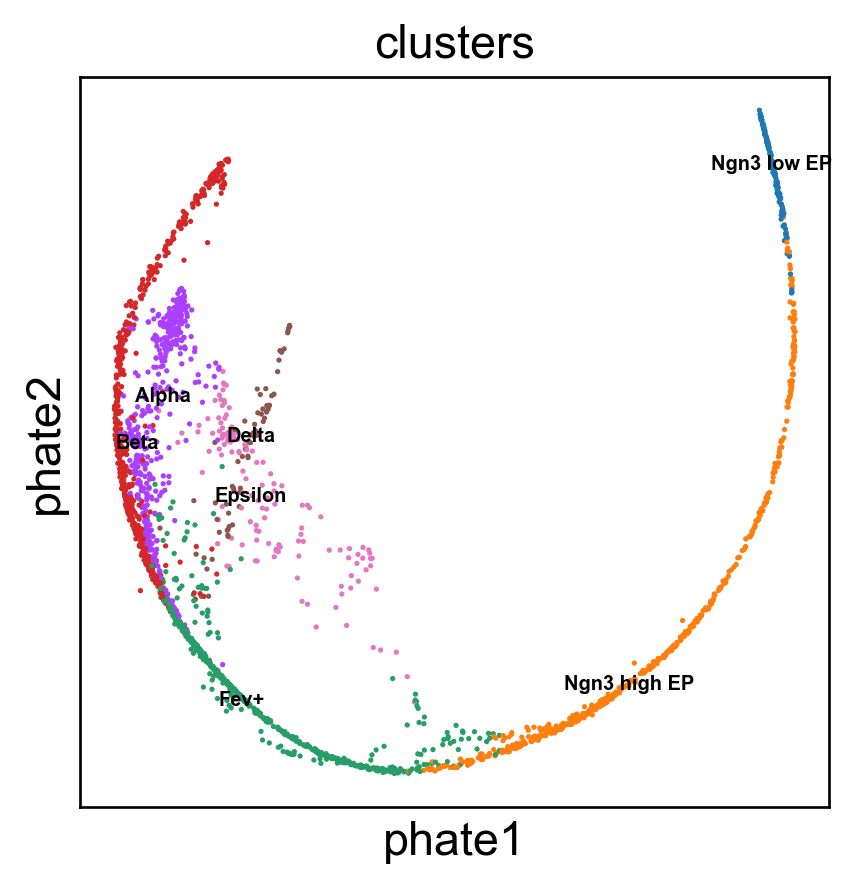

Running PHATE on 2531 observations and 100 variables.
Calculating graph and diffusion operator...
  Calculating KNN search...
  Calculated KNN search in 0.68 seconds.
  Calculating affinities...
  Calculated affinities in 0.03 seconds.
Calculated graph and diffusion operator in 0.72 seconds.
Calculating landmark operator...
  Calculating SVD...
  Calculated SVD in 0.36 seconds.
  Calculating KMeans...
  Calculated KMeans in 9.76 seconds.
Calculated landmark operator in 11.01 seconds.
2531


In [13]:
# PHATE embedding
import phate
data = adata.obsm['X_svd'].copy()

phate_op = phate.PHATE()
phate_op.fit(data)
adata.obsm['X_phate'] = phate_op.transform(data)
sc.pl.embedding(adata, 'phate',legend_fontsize=6, s=10, legend_loc='on data', color=['clusters'])

phate_op = phate.PHATE()
emb_phate_obj = phate_op.fit(data)
phate_graph = emb_phate_obj.graph.to_igraph()
# number of nodes
print(phate_graph.vcount())
# to networkx
phate_graph_nx = phate_graph.to_networkx()


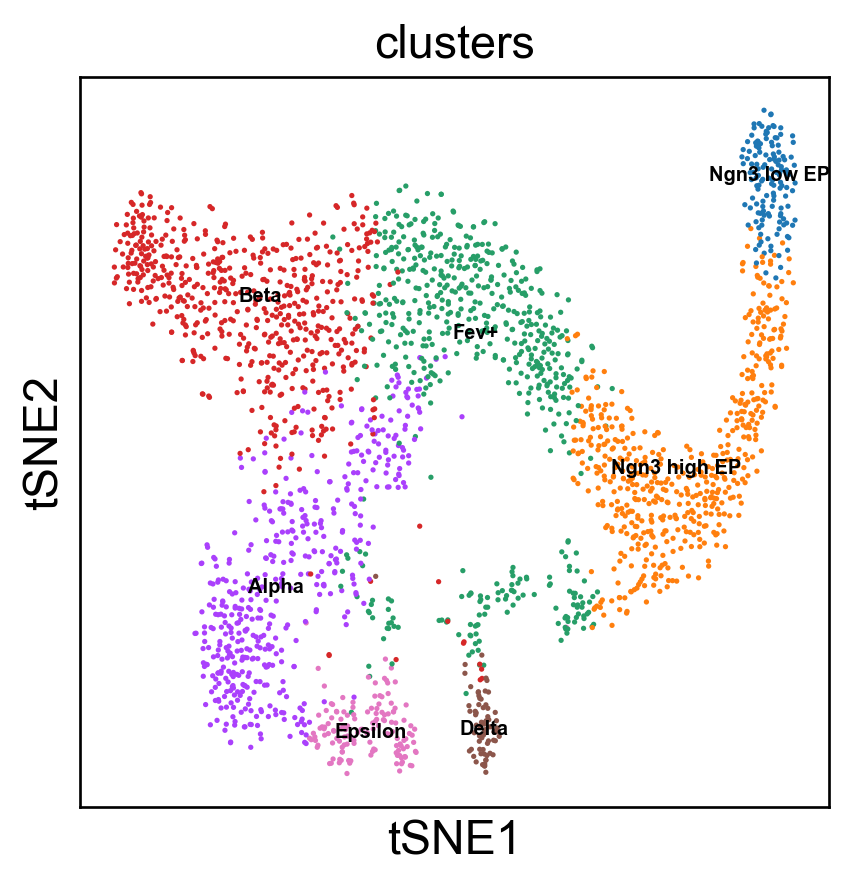

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

data = adata.obsm['X_svd'].copy()

# t-SNE plot
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2)
emb_tsne = tsne.fit_transform(data)

adata.obsm['X_tsne'] = emb_tsne
sc.pl.embedding(adata, 'tsne',legend_fontsize=6, s=10, legend_loc='on data', color=['clusters'])

# kNN graph with k=30
from sklearn.neighbors import kneighbors_graph
k = 30
knn_graph = kneighbors_graph(data, n_neighbors=k, mode="connectivity")

tsne_graph = knn_graph


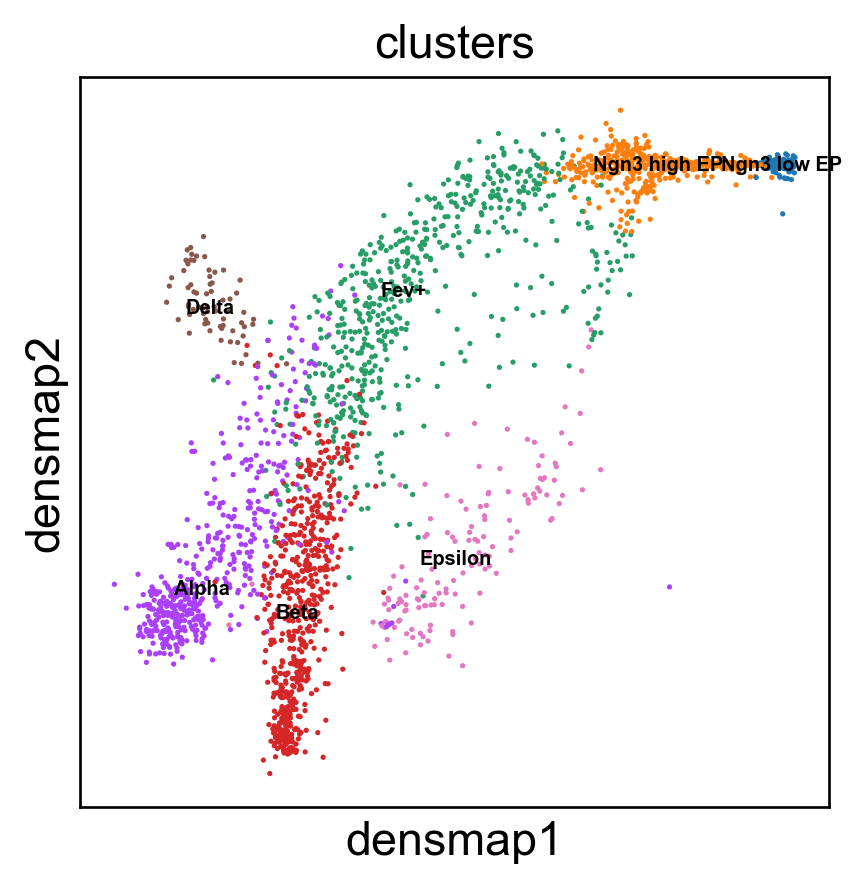

In [15]:
# densMAP plot
import umap

data = adata.obsm['X_svd'].copy()
emb_densmap = umap.UMAP(n_neighbors=30, min_dist=0.3, densmap=True).fit(data)
densmap_graph = emb_densmap.graph_

adata.obsm['X_densmap'] = emb_densmap.embedding_
sc.pl.embedding(adata, 'densmap',legend_fontsize=6, s=10, legend_loc='on data', color=['clusters'])


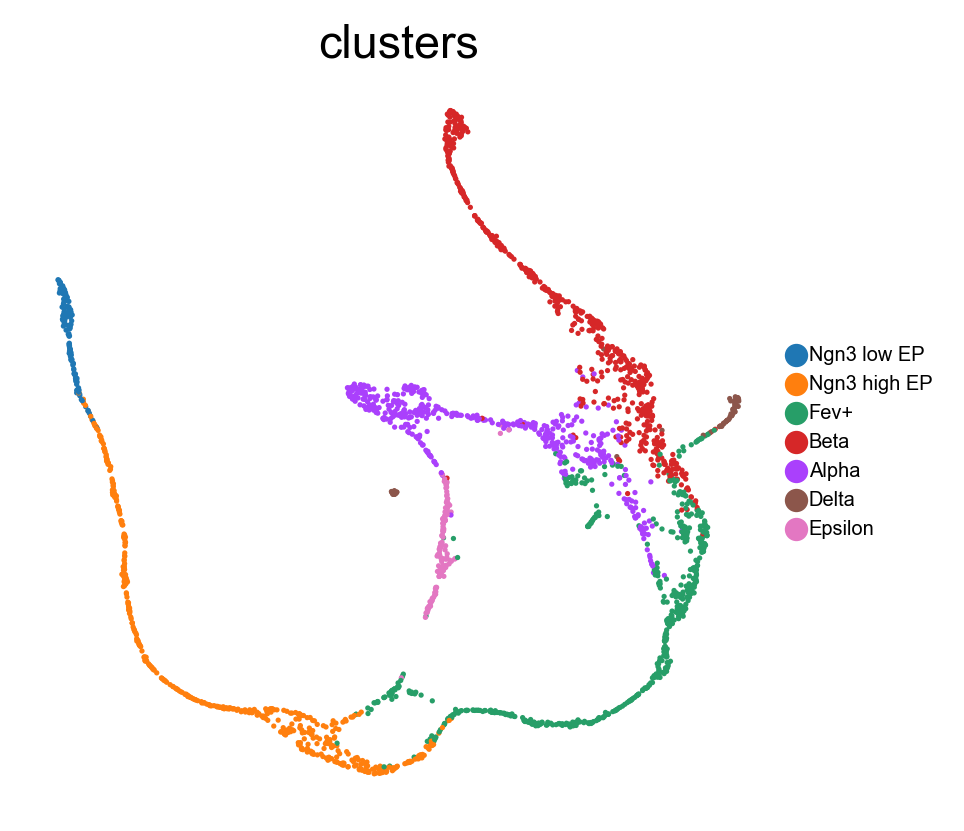

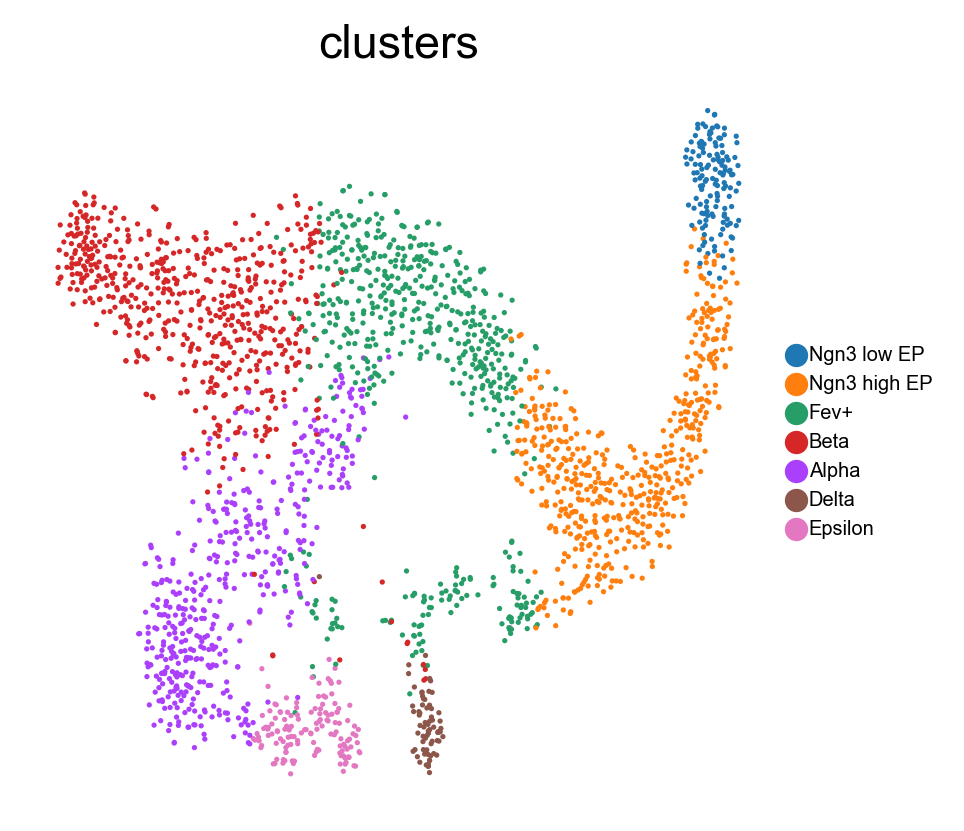

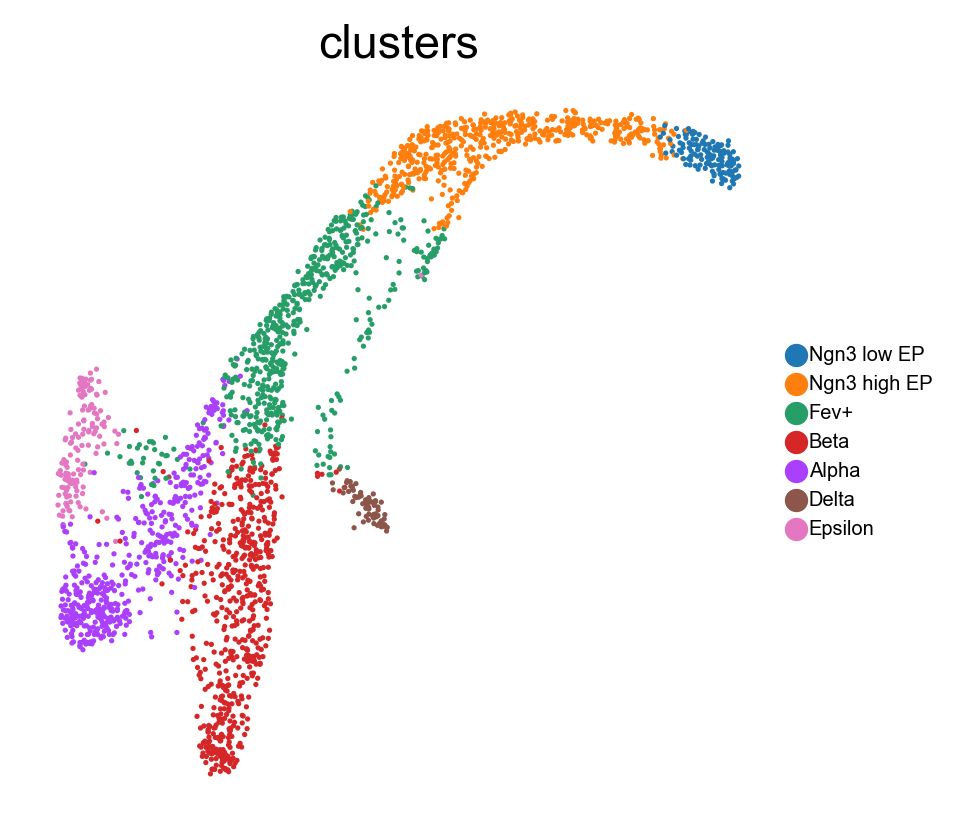

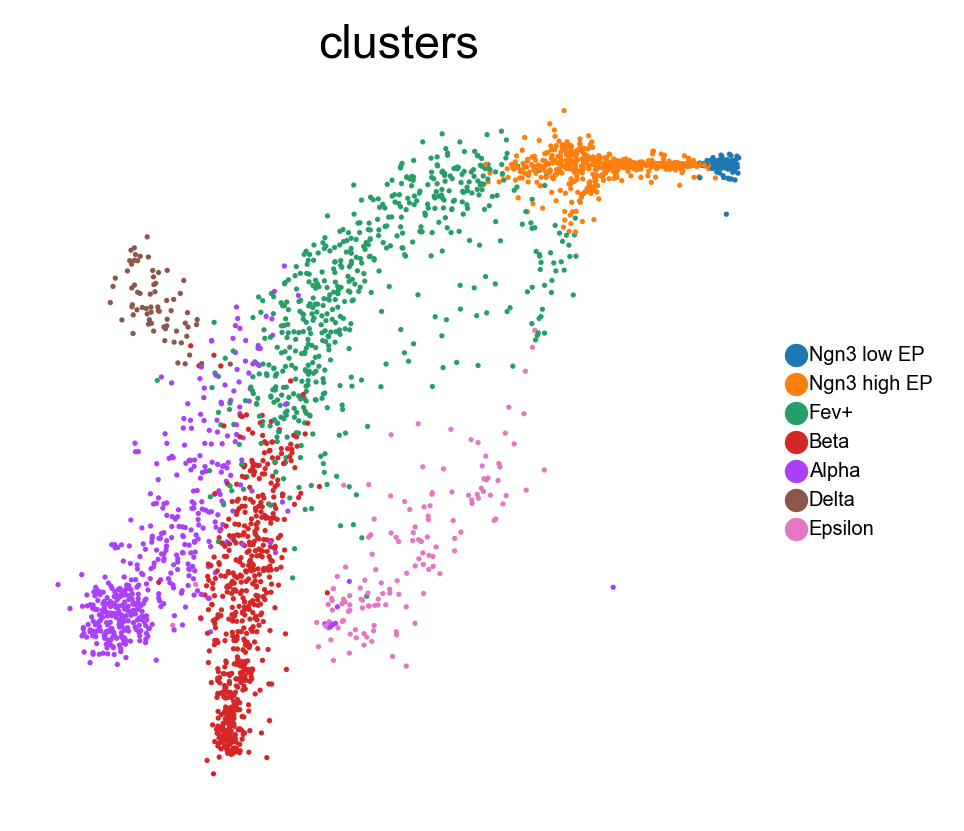

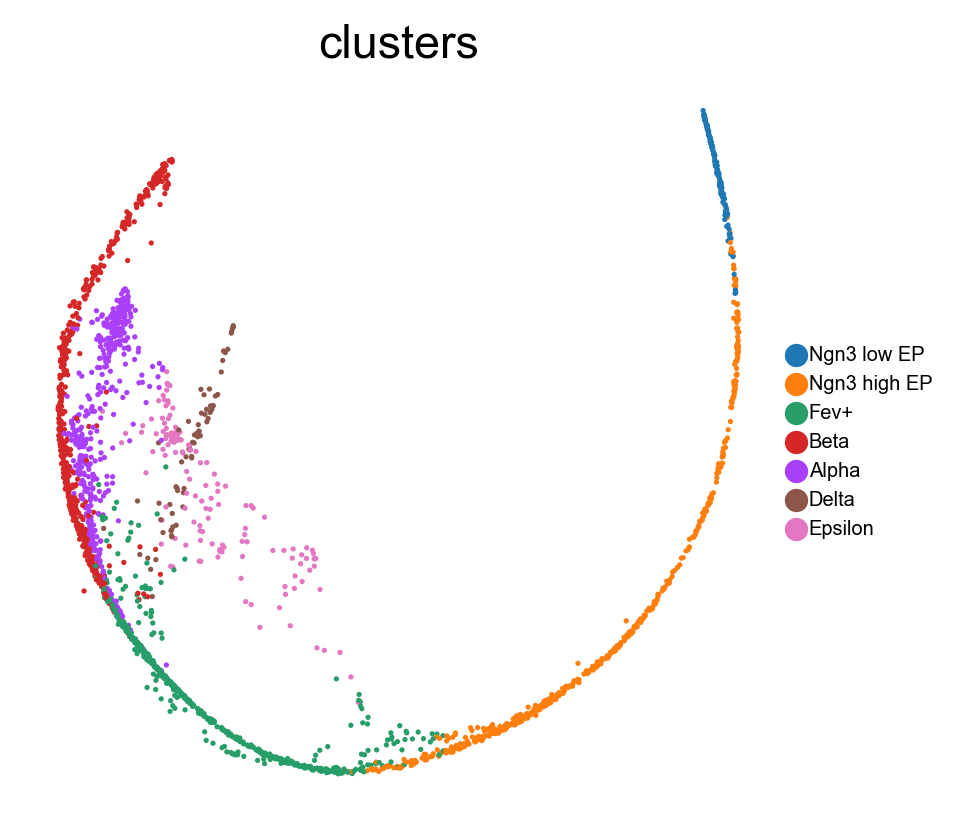

In [17]:
sc.pl.embedding(adata, 'featmap_v',legend_fontsize=6, s=10,  color=['clusters'], frameon=False)
# sc.pl.embedding(adata, 'pca',legend_fontsize=6, s=10,  color=['clusters'],frameon=False) 
sc.pl.embedding(adata, 'tsne',legend_fontsize=6, s=10, color=['clusters'],frameon=False)
sc.pl.embedding(adata, 'umap',legend_fontsize=6, s=10,  color=['clusters'],frameon=False)
sc.pl.embedding(adata, 'densmap',legend_fontsize=6, s=10,  color=['clusters'], frameon=False)
sc.pl.embedding(adata, 'phate',legend_fontsize=6, s=10,  color=['clusters'],   frameon=False)


##### Transition state and core state by density, curvature and betweenness centrality.

Use density to depict the transition and core states.

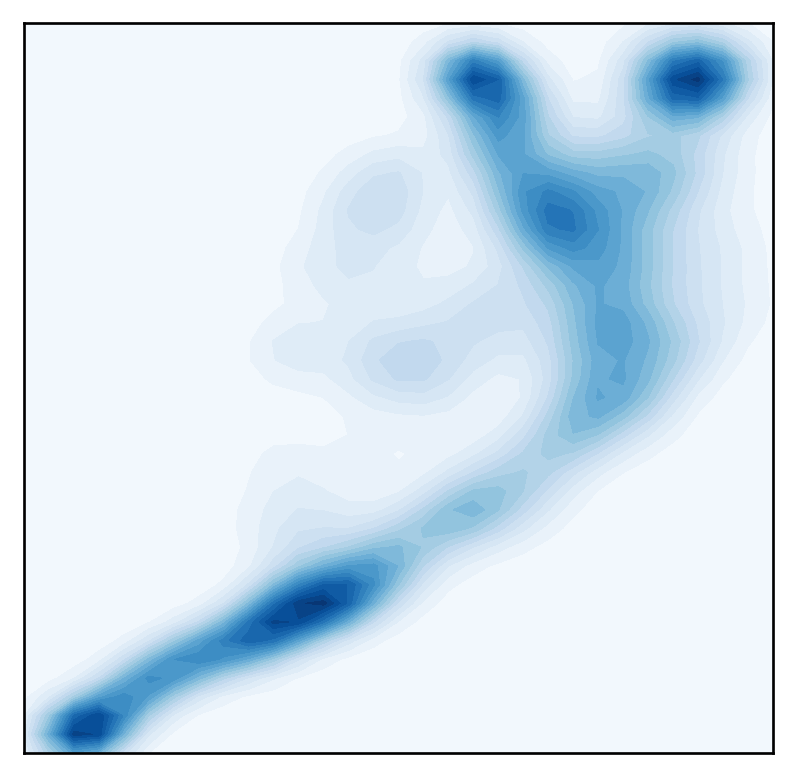

<Figure size 480x480 with 0 Axes>

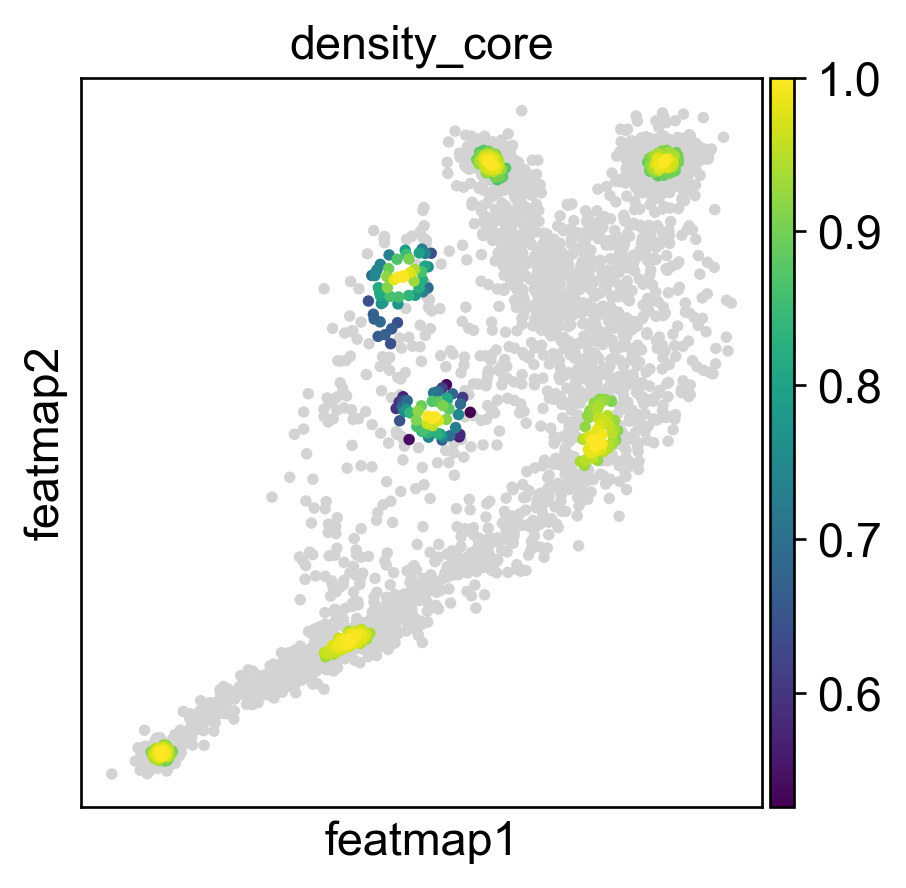

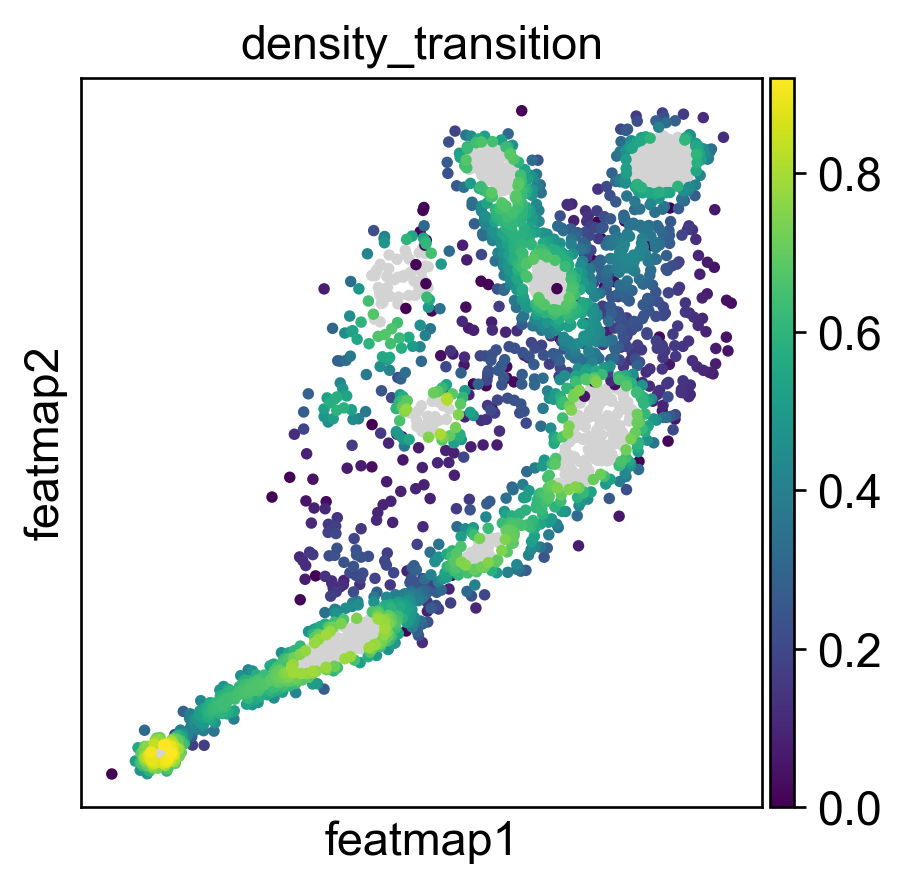

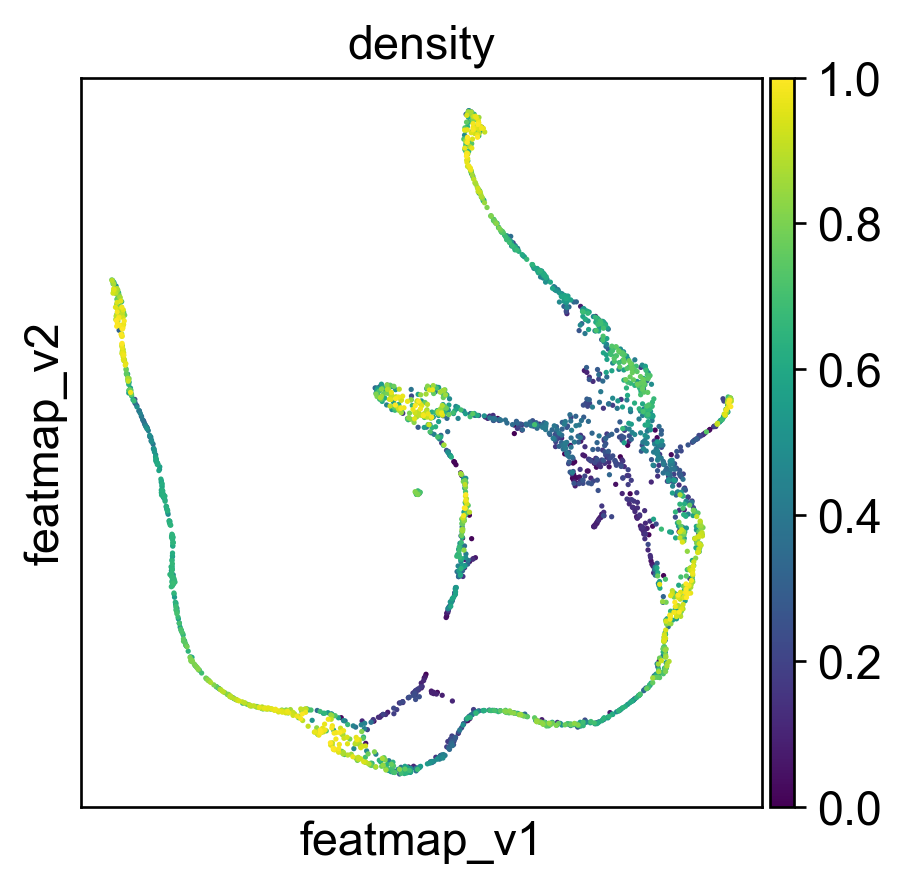

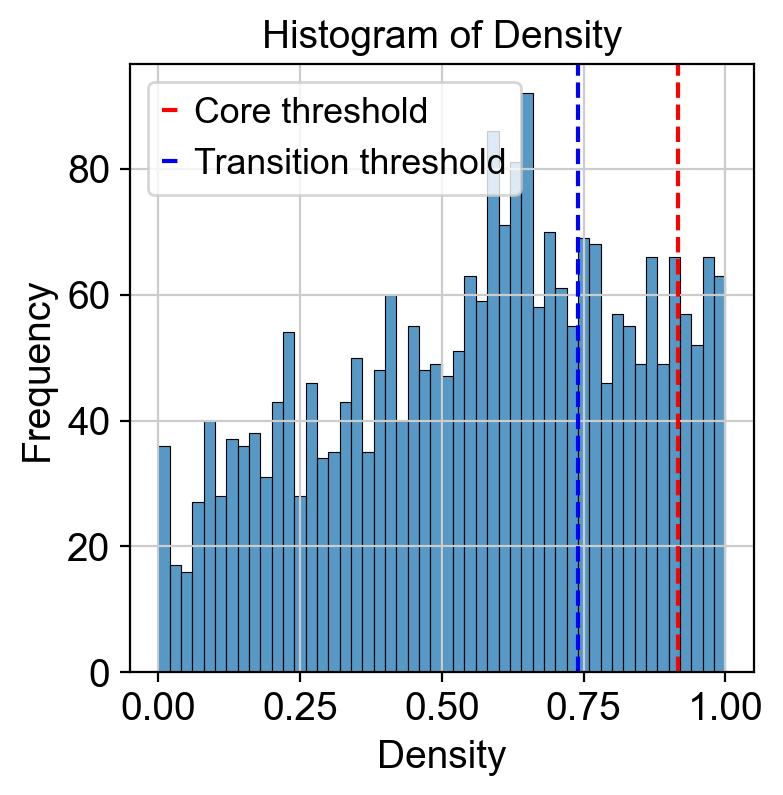

In [18]:
##################################
# Contour plot to show the density
######################################
from featuremap import core_transition_states
import importlib
importlib.reload(core_transition_states)

from featuremap.core_transition_states import plot_density
plot_density(adata)


#%%
#######################################################
# Compute core-states based on clusters
#########################################################
quantile_core = 0.9
quantile_trans = 0.7


from featuremap.core_transition_states import compute_density
compute_density(adata, quantile_core=quantile_core, quantile_trans=quantile_trans, cluster_key='clusters')  


# import scanpy as sc
# sc.pl.embedding(adata, basis='X_featmap_v', color='core_trans_states',  )
sc.pl.embedding(adata, 'featmap_v',legend_fontsize=6, s=10, legend_loc='on data', color='density')

# plot histogram of density
import seaborn as sns
import matplotlib.pyplot as plt

density = adata.obs['density']

plt.figure(dpi=100)
sns.histplot(density, bins=50)
plt.xlabel('Density')
plt.ylabel('Frequency')
plt.title('Histogram of Density')
threshold_core = density.quantile(quantile_core)
plt.axvline(threshold_core, color='red', linestyle='--', label='Core threshold')

threshold_trans = density.quantile(quantile_trans)
plt.axvline(threshold_trans, color='blue', linestyle='--', label='Transition threshold')
plt.legend()

plt.show()




Use curvature to define the transtion and core states.

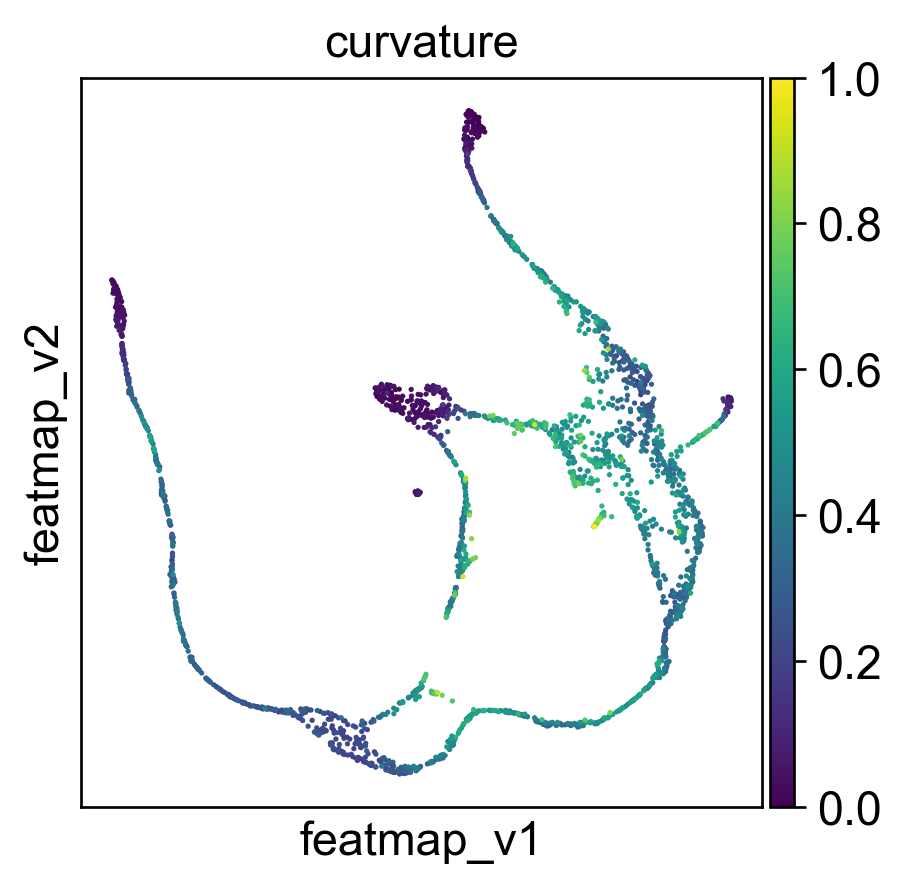

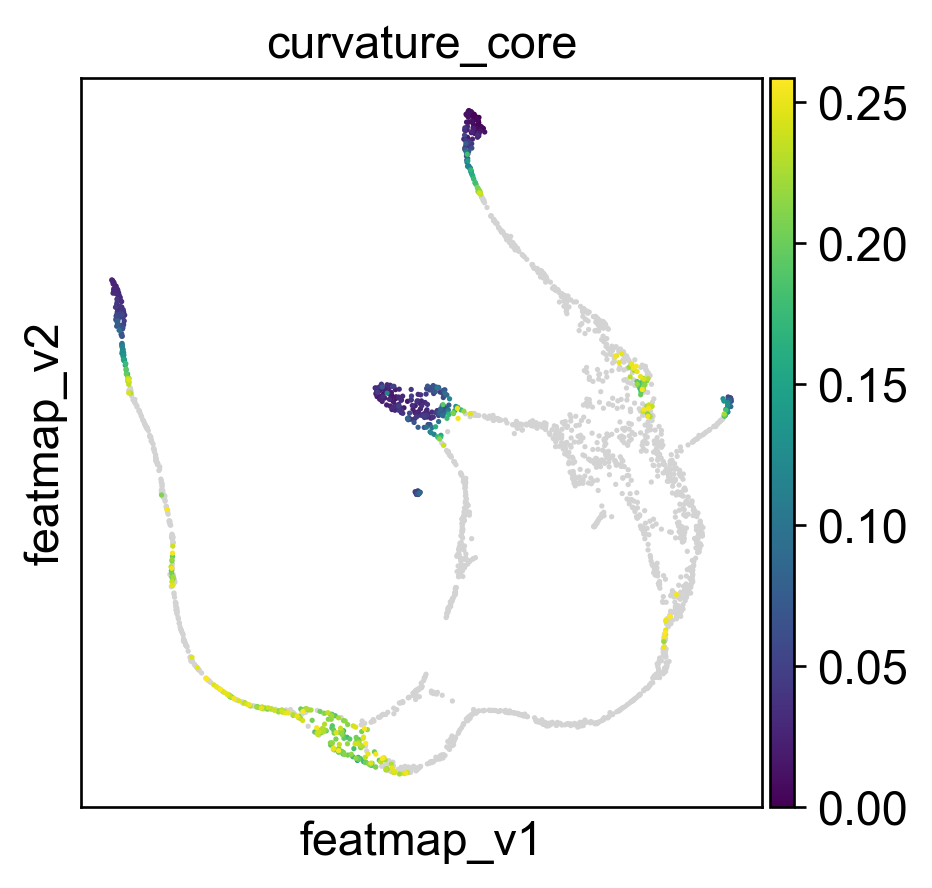

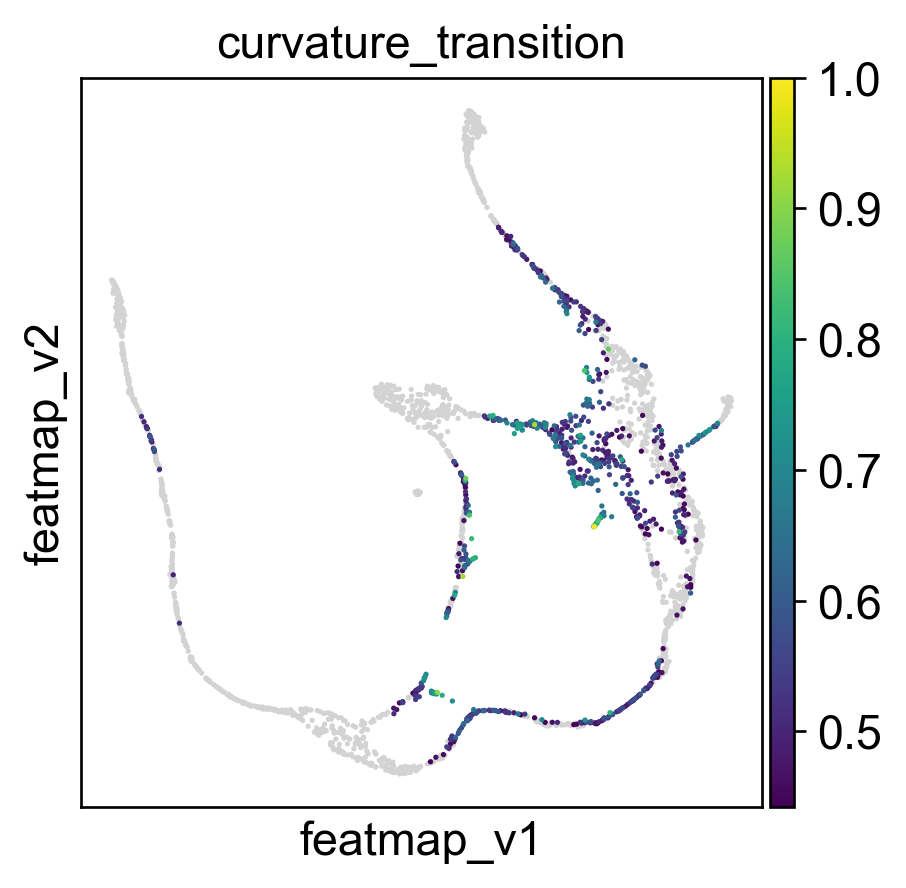

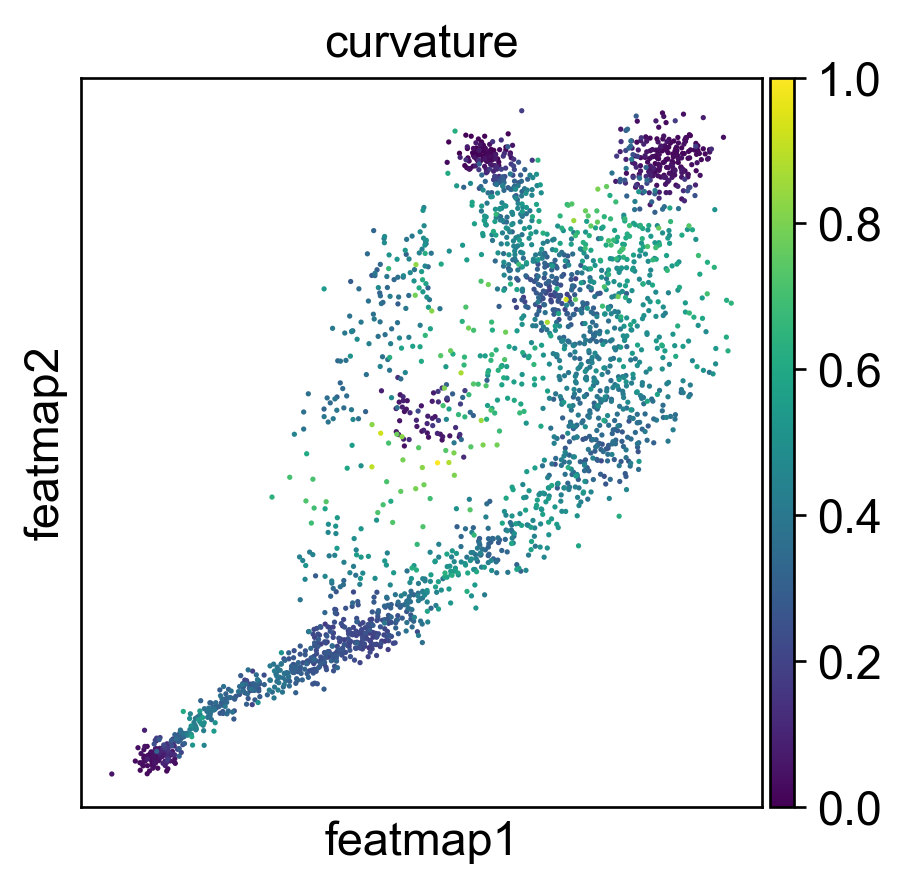

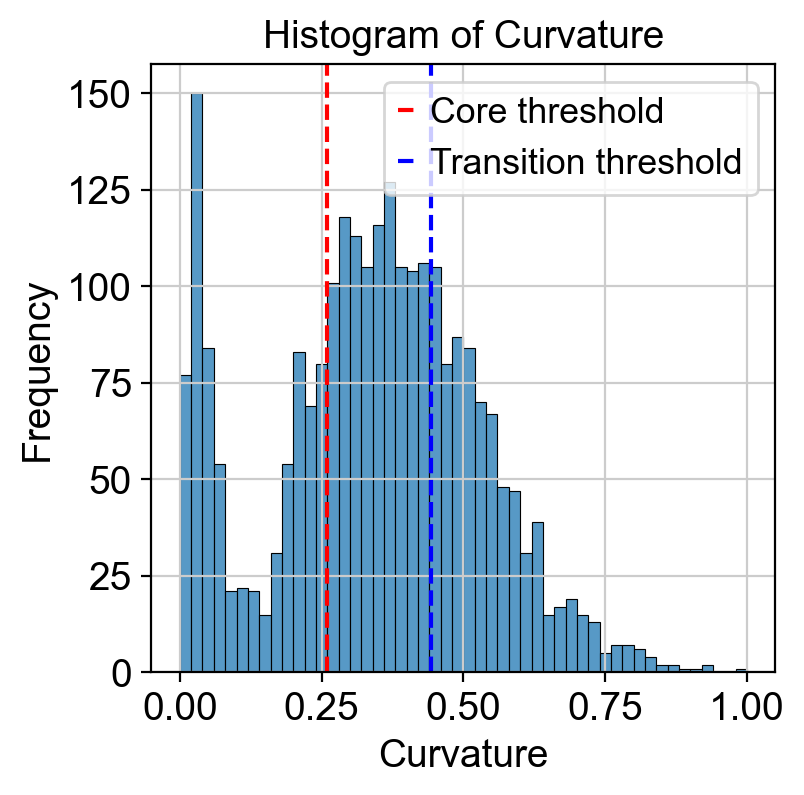

In [19]:
from featuremap import core_transition_states
import importlib
importlib.reload(core_transition_states)

quantile_core = 0.3
quantile_trans = 0.7
core_transition_states.compute_curvature(adata, emb_featuremap, quantile_core=quantile_core, quantile_trans=quantile_trans)

sc.pl.embedding(adata, 'featmap',legend_fontsize=6, s=10, legend_loc='on data', color='curvature')

# plot histogram of curvature
import seaborn as sns
import matplotlib.pyplot as plt

curvature = adata.obs['curvature']

plt.figure(dpi=100)
sns.histplot(curvature, bins=50)
plt.xlabel('Curvature')
plt.ylabel('Frequency')
plt.title('Histogram of Curvature')
threshold_core = curvature.quantile(quantile_core)
plt.axvline(threshold_core, color='red', linestyle='--', label=f'Core threshold')

threshold_trans = curvature.quantile(quantile_trans)
plt.axvline(threshold_trans, color='blue', linestyle='--', label=f'Transition threshold')
plt.legend()

plt.show()


Use betweeness centrality to define transition states.

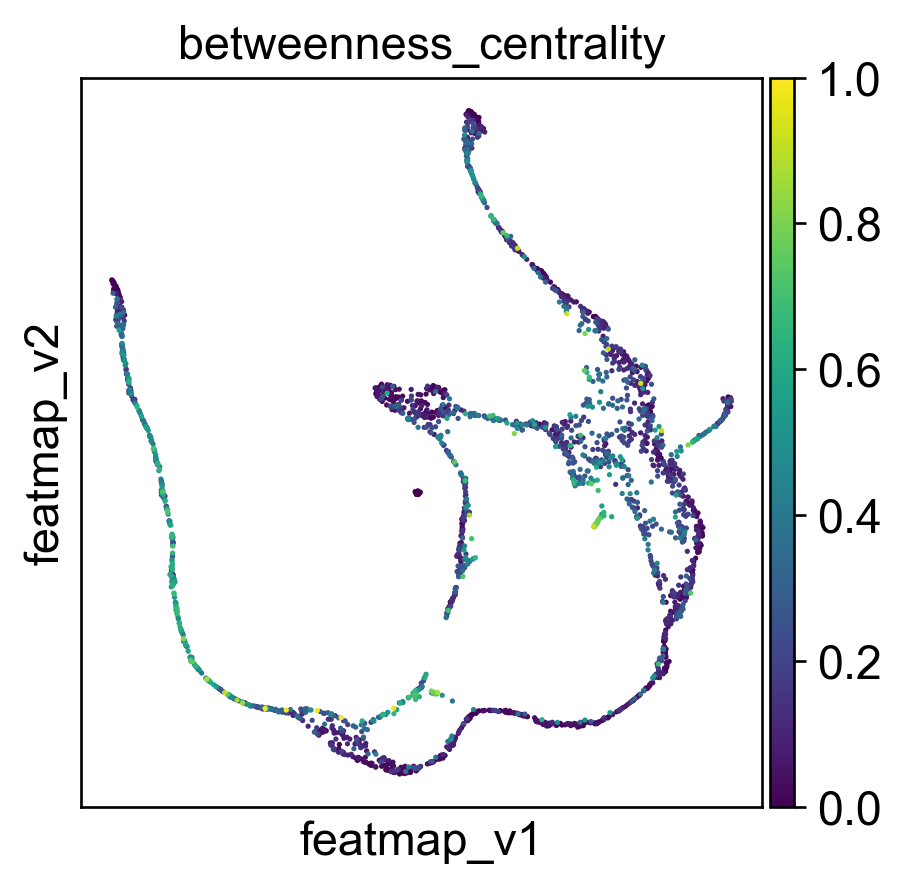

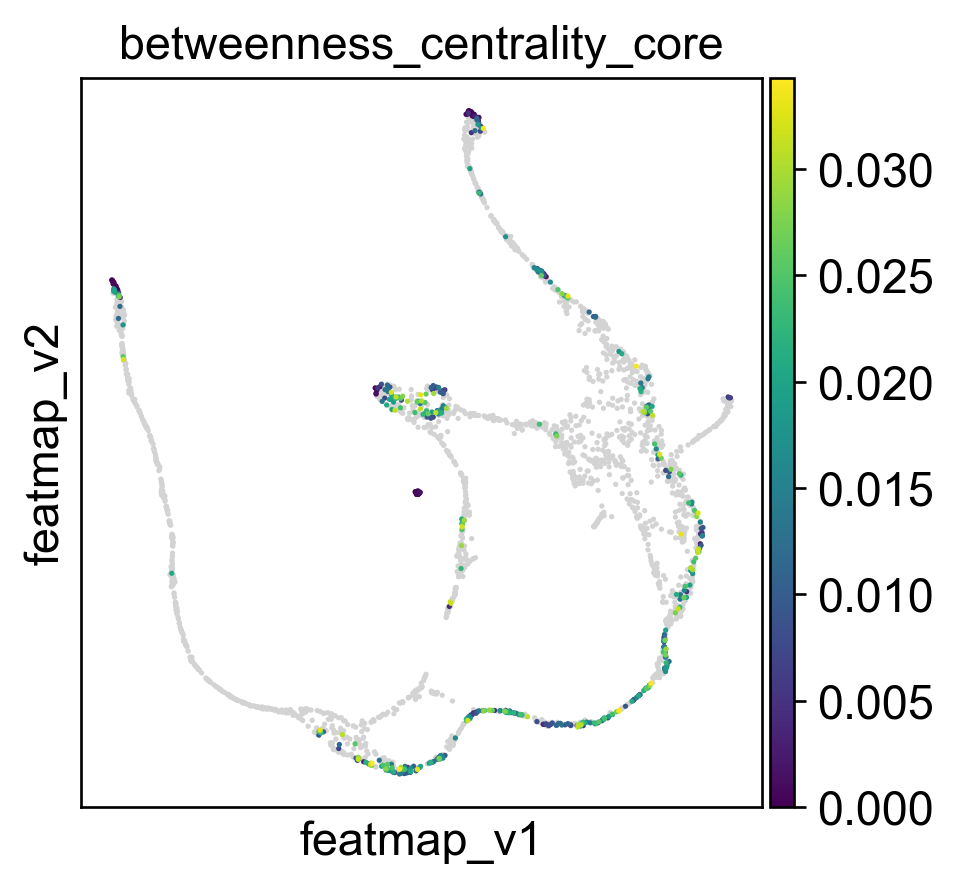

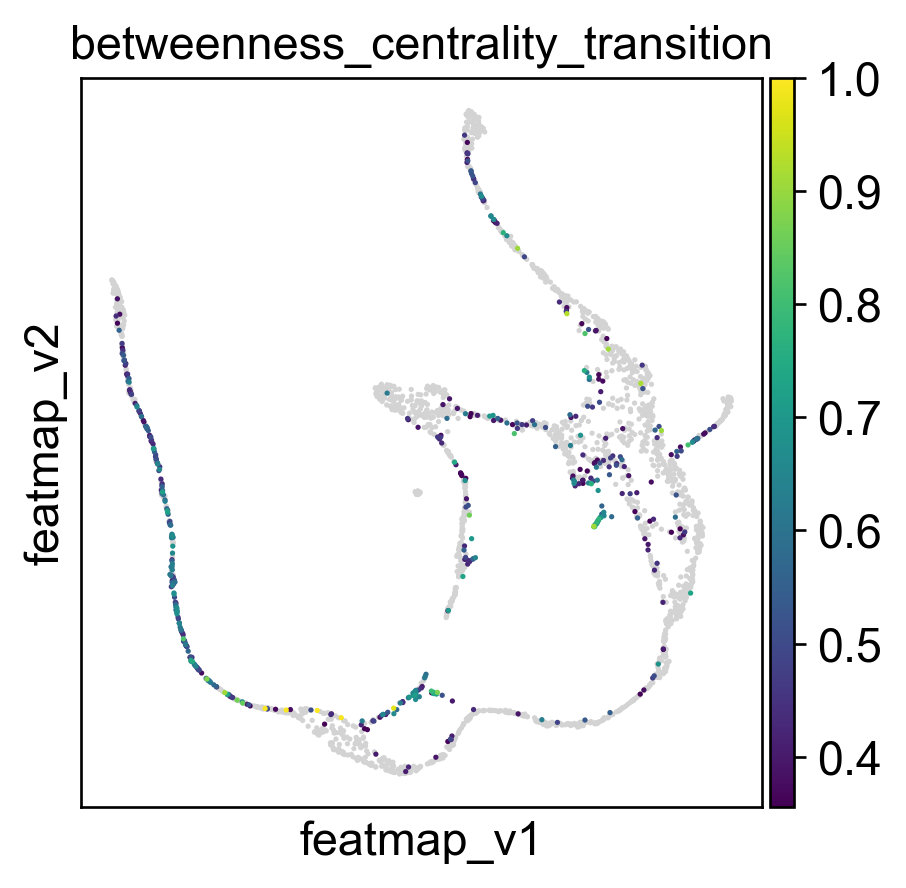

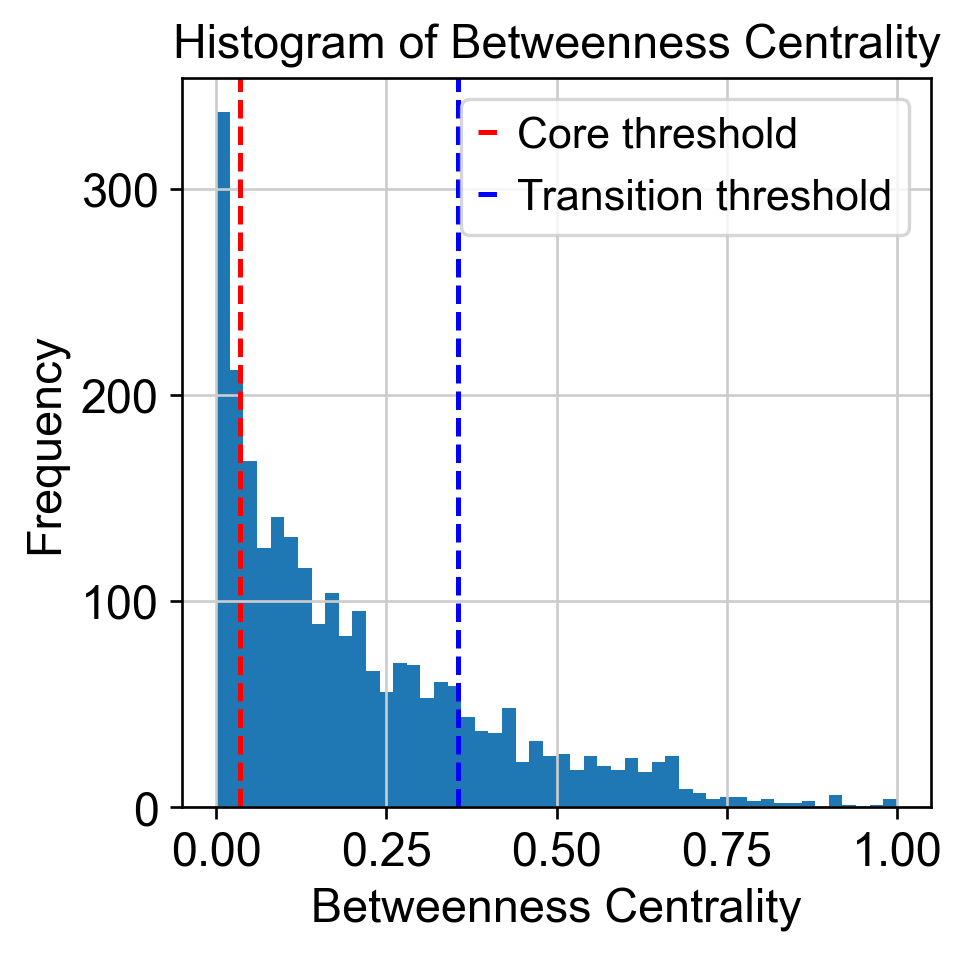

In [20]:
from featuremap import core_transition_states
import importlib
importlib.reload(core_transition_states)

quantile_trans = 0.8
quantile_core = 0.2


core_transition_states.compute_betweenness_centrality(adata, emb_featuremap, quantile_core=quantile_core, quantile_trans=quantile_trans)

betweenness_centrality = adata.obs['betweenness_centrality'].copy()
plt.hist(betweenness_centrality, bins=50)

threshold_core = betweenness_centrality.quantile(quantile_core)
plt.axvline(threshold_core, color='red', linestyle='--', label=f'Core threshold')

threshold_trans = betweenness_centrality.quantile(quantile_trans)
plt.axvline(threshold_trans, color='blue', linestyle='--', label=f'Transition threshold')  
plt.legend()

plt.xlabel('Betweenness Centrality')
plt.ylabel('Frequency')
plt.title('Histogram of Betweenness Centrality')

plt.show()

Create adata_var for clustering on variation space.

In [21]:
import anndata as ad
adata_var = ad.AnnData(X=adata.obsm['variation_pc'], obs=adata.obs)
adata_var.obsm['X_featmap_v'] = adata.obsm['X_featmap_v']
# adata_var.obs['clusters'] = adata.obs['clusters']

# leiiden clustering on variation embedding
sc.pp.pca(adata_var)
sc.pp.neighbors(adata_var, n_neighbors=5,)
sc.tl.leiden(adata_var, resolution=0.5)

adata.obs['leiden_v'] = adata_var.obs['leiden']



Visualize transition and core states by density, curvature and betweenness centrality.

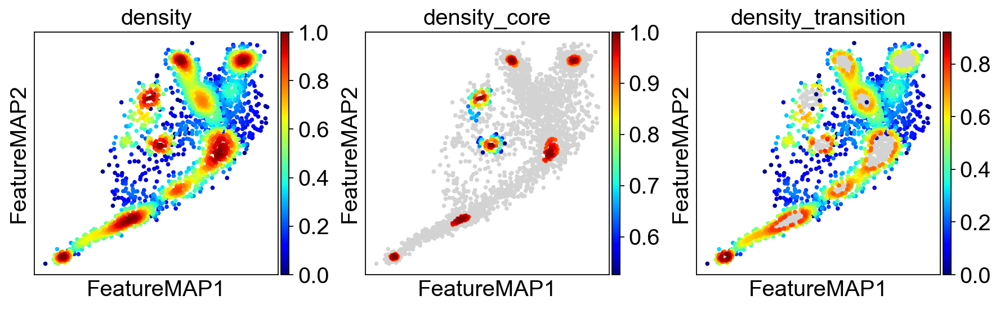

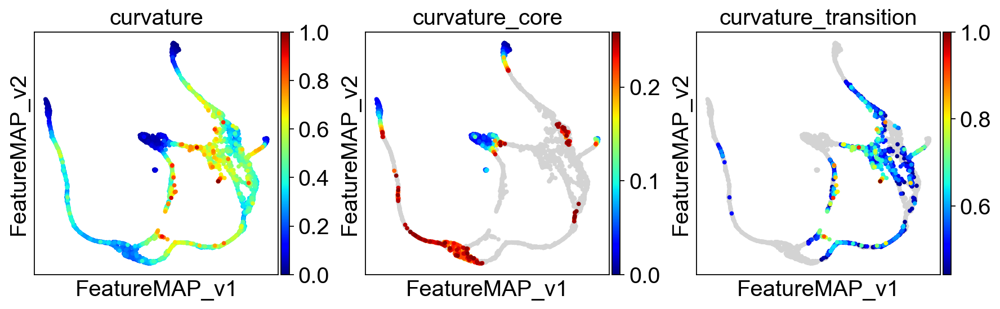

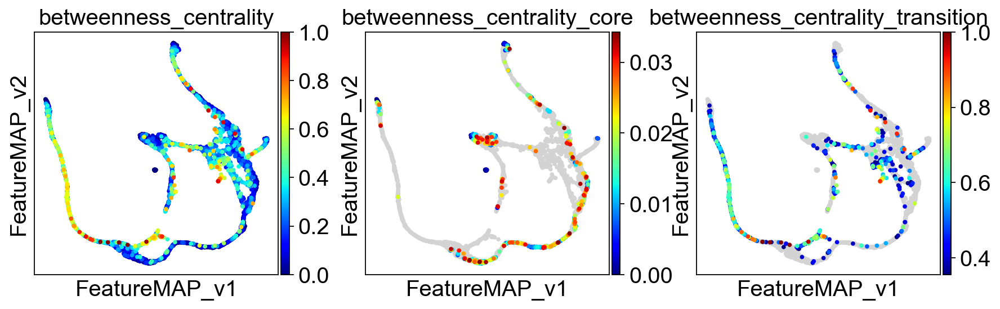

In [22]:

adata.obsm['X_FeatureMAP'] = adata.obsm['X_featmap']
adata.obsm['X_FeatureMAP_v'] = adata.obsm['X_featmap_v']

sc.set_figure_params(figsize=(3.5, 3.5),fontsize=18)

sc.pl.embedding(adata, basis='FeatureMAP', color=['density', 'density_core', 'density_transition'], cmap='jet',)

sc.pl.embedding(adata, basis='FeatureMAP_v', color=['curvature', 'curvature_core', 'curvature_transition'], cmap='jet', )
sc.pl.embedding(adata, basis='FeatureMAP_v', color=['betweenness_centrality', 'betweenness_centrality_core', 'betweenness_centrality_transition'], 
                cmap='jet',)


##### Union the results of transtion and core states from density, curvature and betweenness centrality.

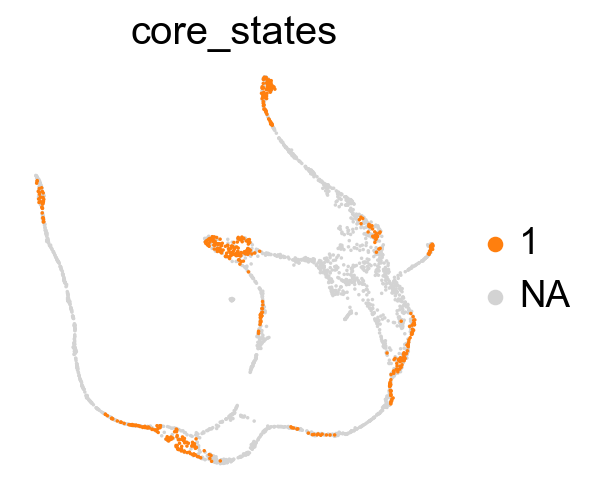

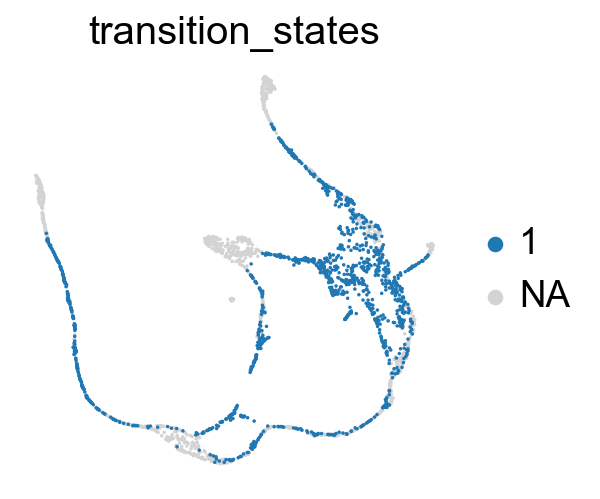

In [23]:
from featuremap import core_transition_states

import importlib
importlib.reload(core_transition_states)

core_transition_states.plot_core_transition_states(adata)

##### Compute the cluster state labels based on the percentage of core_states and transition_states for each cluster.

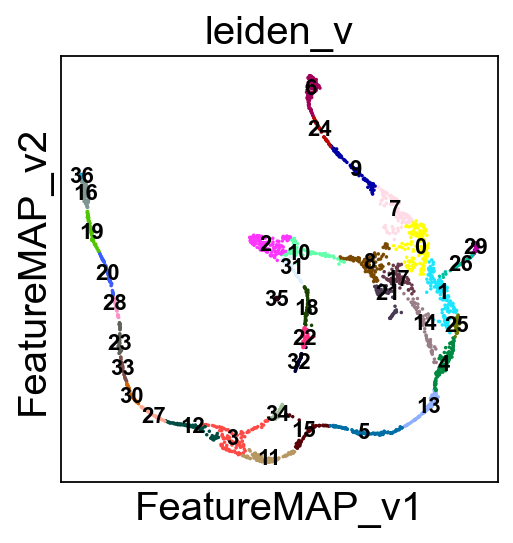

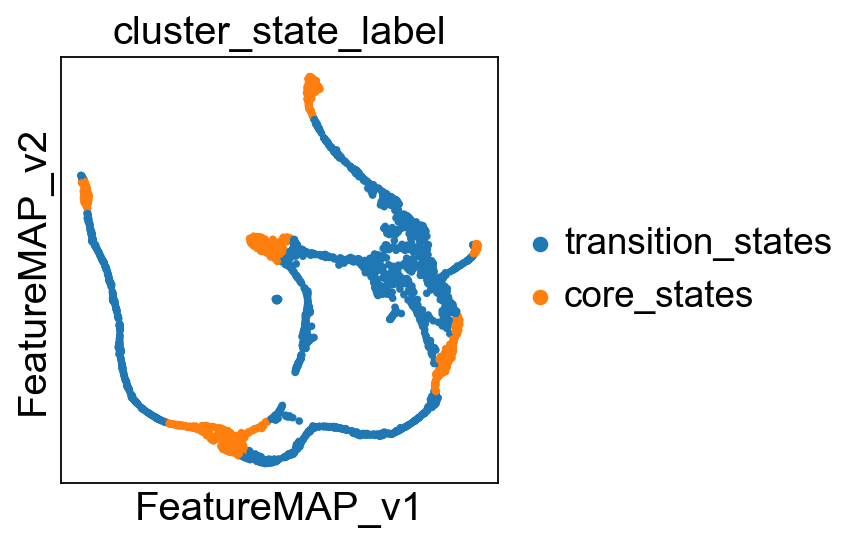

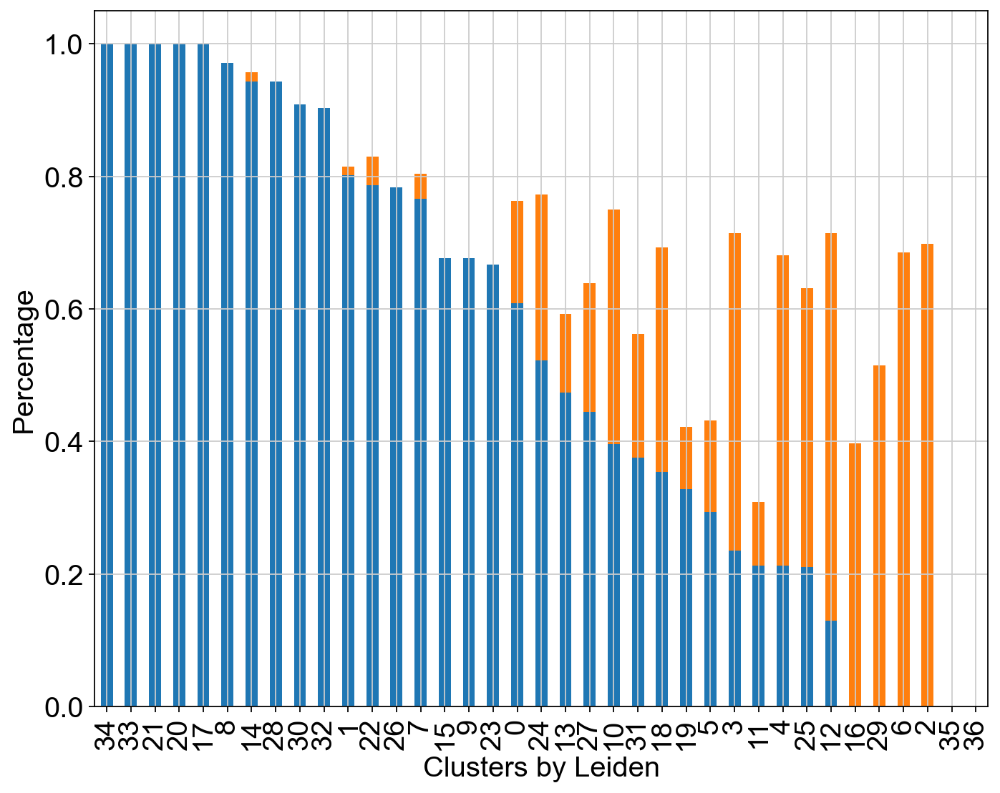

In [24]:
from featuremap import core_transition_states

import importlib
importlib.reload(core_transition_states)

# plot leiden clustering on variation embedding
sc.pl.embedding(adata, basis='FeatureMAP_v', color='leiden_v', legend_loc='on data', legend_fontsize=10, s=10, cmap='tab20')

core_transition_states.compute_cluster_state_labels(adata)

Visualize the transition and core states in different methods.

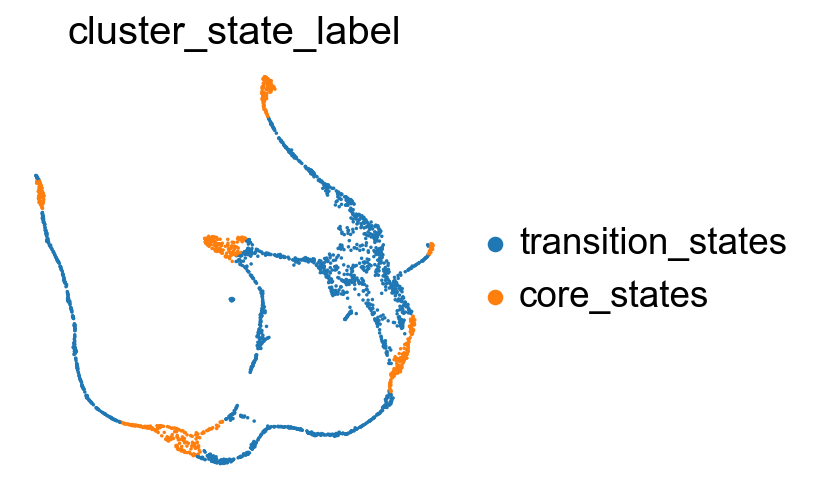

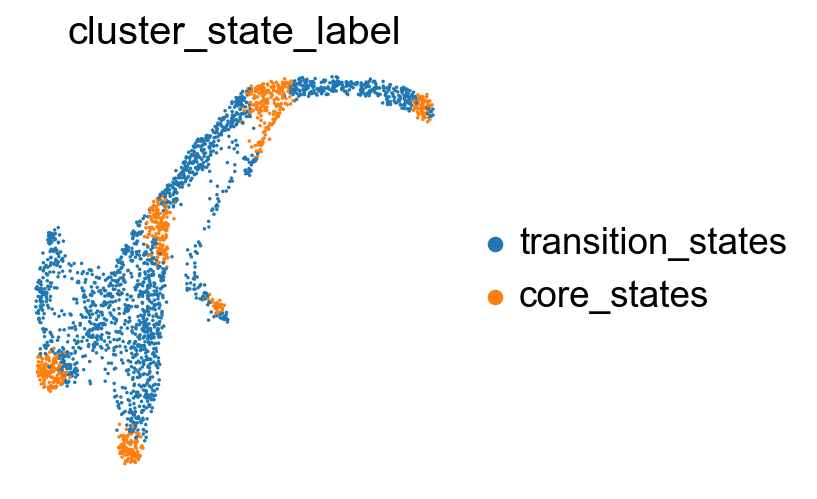

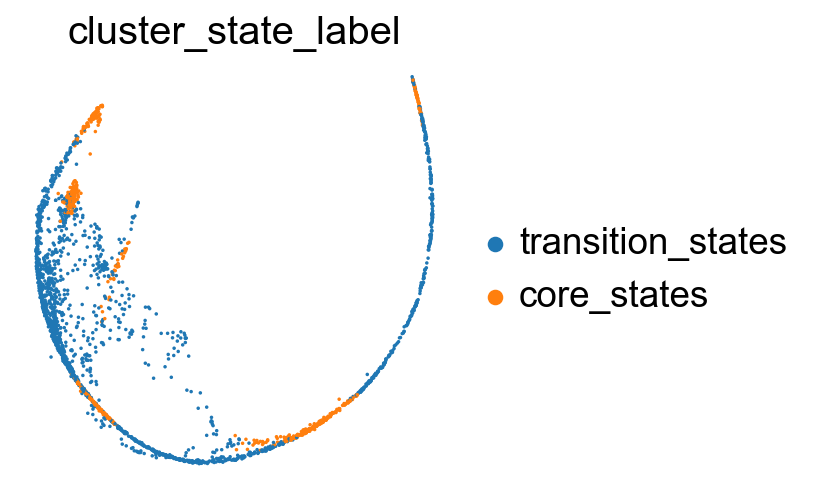

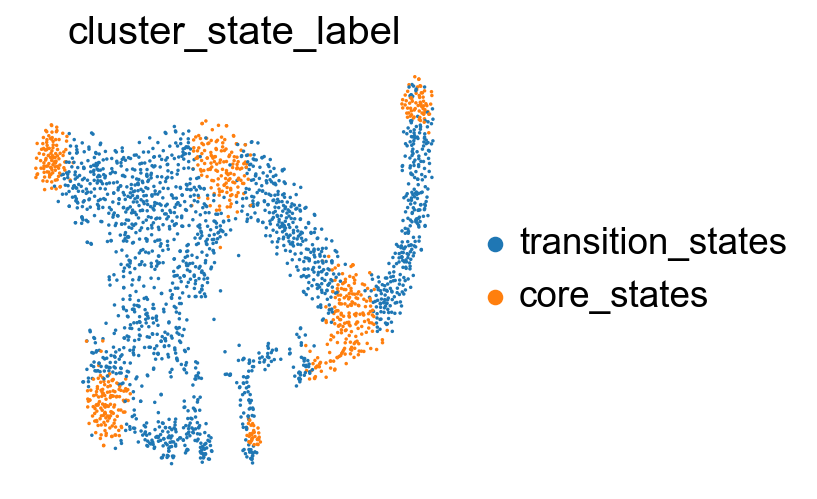

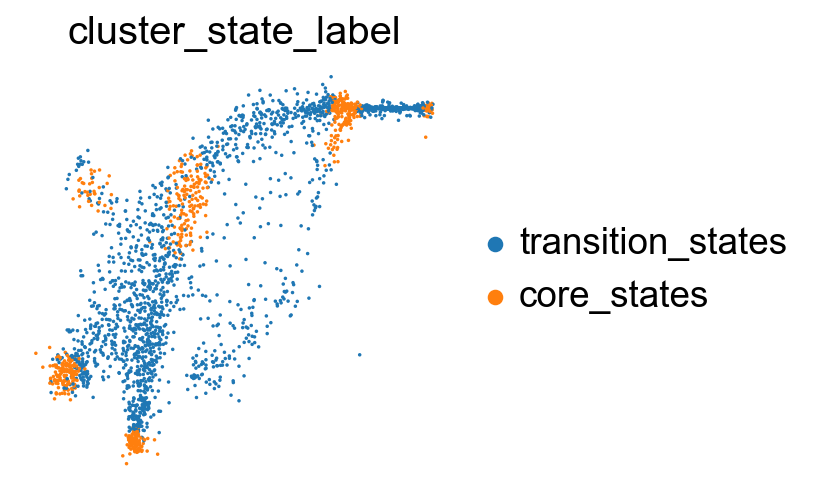

In [25]:

sc.pl.embedding(adata, basis='X_featmap_v', color= ['cluster_state_label'], cmap='Blues_r', s=10, frameon=False)
sc.pl.embedding(adata, basis='X_umap', color= ['cluster_state_label'], cmap='Blues_r', s=10, frameon=False)
sc.pl.embedding(adata, basis='X_phate', color= ['cluster_state_label'], cmap='Blues_r', s=10, frameon=False)
sc.pl.embedding(adata, basis='X_tsne', color= ['cluster_state_label'], cmap='Blues_r', s=10, frameon=False)
sc.pl.embedding(adata, basis='X_densmap', color= ['cluster_state_label'], cmap='Blues_r', s=10, frameon=False)


##### Compare the clustering coefficients of different methods on visualizing the transition and core states.

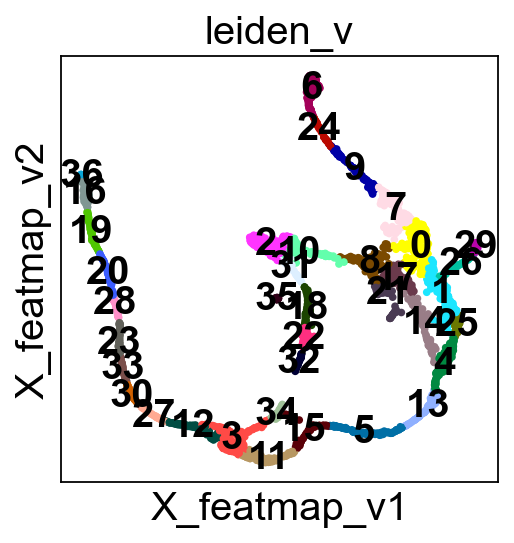

Computing the weighted clustering coefficients...
ANOVA: f_stat: 10.857893858491822, p_val: 7.881398124239267e-06


<Figure size 400x300 with 0 Axes>

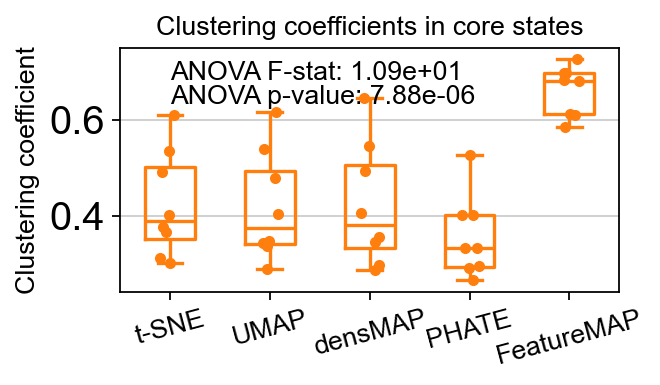

ANOVA: f_stat: 53.11953667444676, p_val: 3.674184091134067e-27


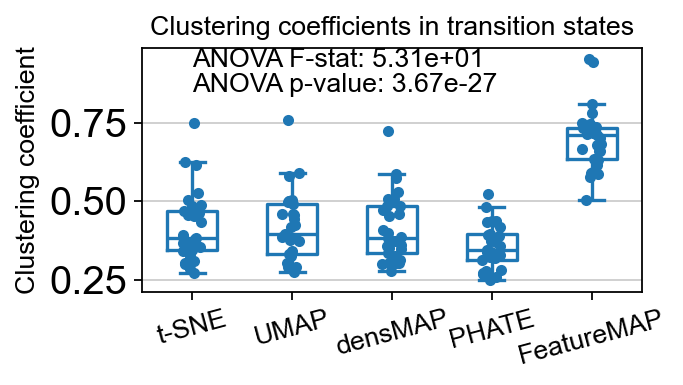

In [26]:
from featuremap import core_transition_states

import importlib
importlib.reload(core_transition_states)
# Example usage:
core_transition_states.compute_and_plot_clustering_coefficients(adata, emb_featuremap, emb_featuremap_v, phate_graph_nx, tsne_graph, densmap_graph)


##### Compare the Silhouette scores of different methods in visualzing the transition and core states.

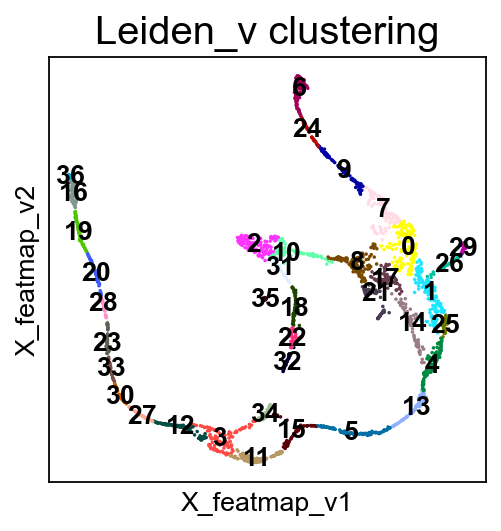

Cluster 0
Cluster 1
Cluster 10
Cluster 11
Cluster 12
Cluster 13
Cluster 14
Cluster 15
Cluster 16
Cluster 17
Cluster 18
Cluster 19
Cluster 2
Cluster 20
Cluster 21
Cluster 22
Cluster 23
Cluster 24
Cluster 25
Cluster 26
Cluster 27
Cluster 28
Cluster 29
Cluster 3
Cluster 30
Cluster 31
Cluster 32
Cluster 33
Cluster 34
Cluster 35
Cluster 36
Cluster 4
Cluster 5
Cluster 6
Cluster 7
Cluster 8
Cluster 9
T-test: t_stat: 1.2974886306820859, p_val: 0.20295021842903682
ANOVA: f_stat: 9.961930951887517, p_val: 1.7242764465835844e-05


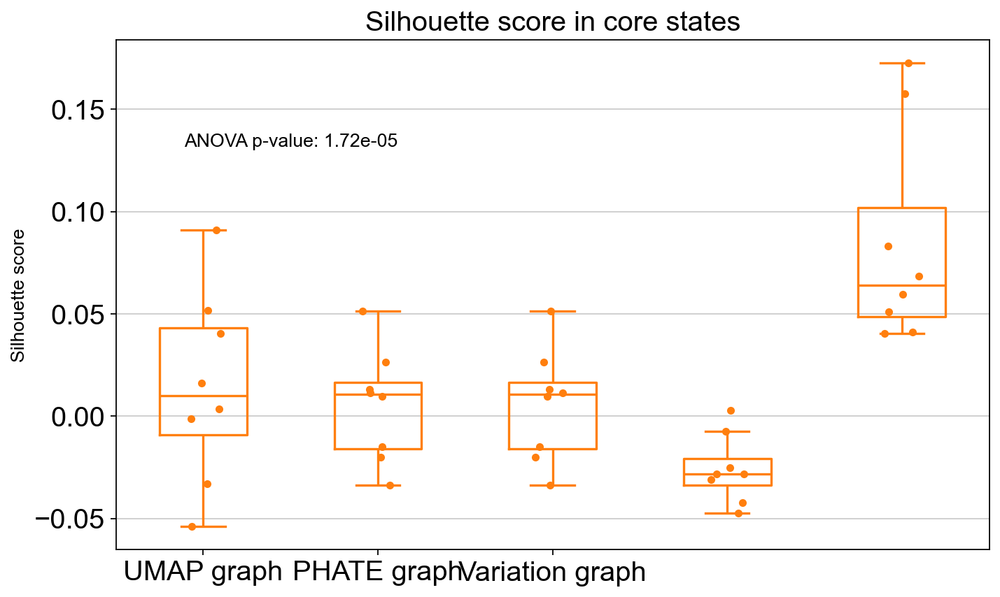

ANOVA: f_stat: 17.165330505584752, p_val: 1.773579502036502e-11


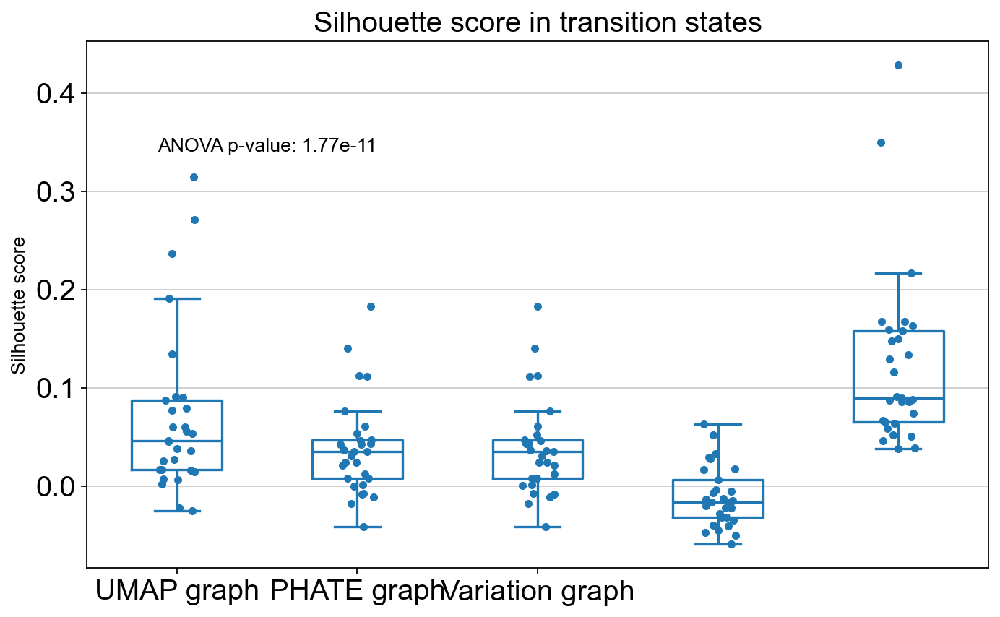

In [27]:
from featuremap import core_transition_states

import importlib
importlib.reload(core_transition_states)

core_transition_states.compute_and_plot_silhouette_scores(adata, emb_featuremap, emb_featuremap_v, phate_graph_nx, tsne_graph, densmap_graph)

#### Compute pseudotime based on variation space.

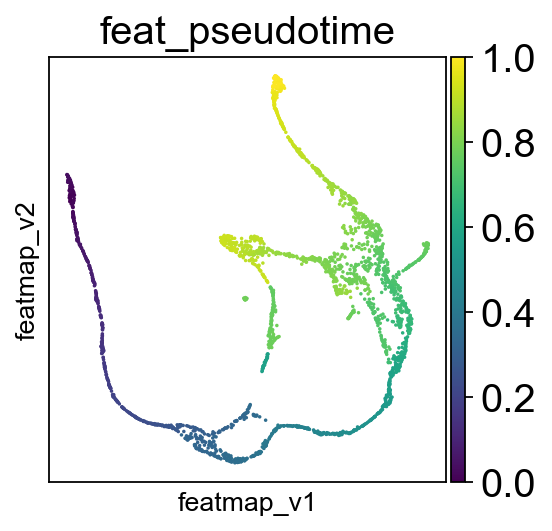

In [28]:
# FeatureMAP pseudo-time
from featuremap import features
import importlib
importlib.reload(features)

# Starting point index
# Randomly select a starting point from cluster "Ng3 low EP"
start_point_index = np.where(adata.obs['clusters'] == 'Ngn3 low EP')[0][0]
features.pseudotime_mst(adata, random_state=42, start_point_index=start_point_index)

sc.pl.embedding(adata, 'featmap_v',legend_fontsize=10, s=10, color=['feat_pseudotime'])

## Transition states reveal the lineage genes towards Alpha cells and Beta cells respectively.

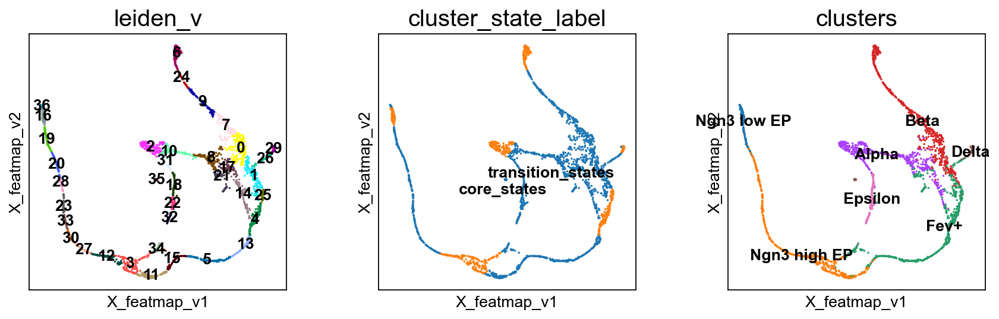

In [29]:

sc.pl.embedding(adata, basis='X_featmap_v', color=['leiden_v', 'cluster_state_label', 'clusters'], cmap='viridis', s=10, legend_loc='on data')


Visualize the transition and core states on the bifurcation divergent of pancreas data.

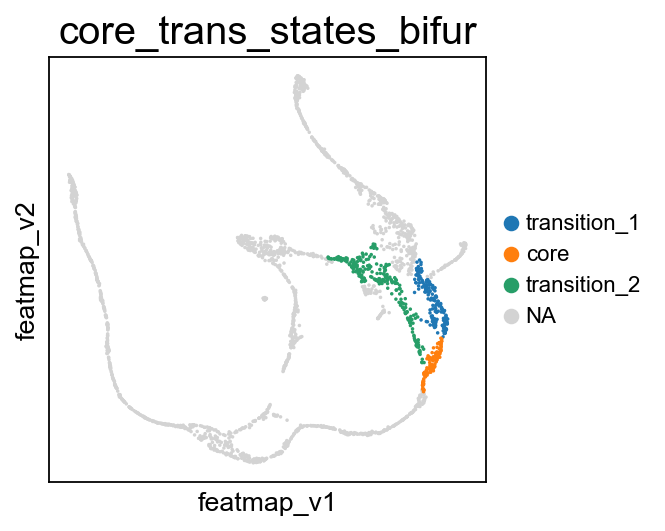

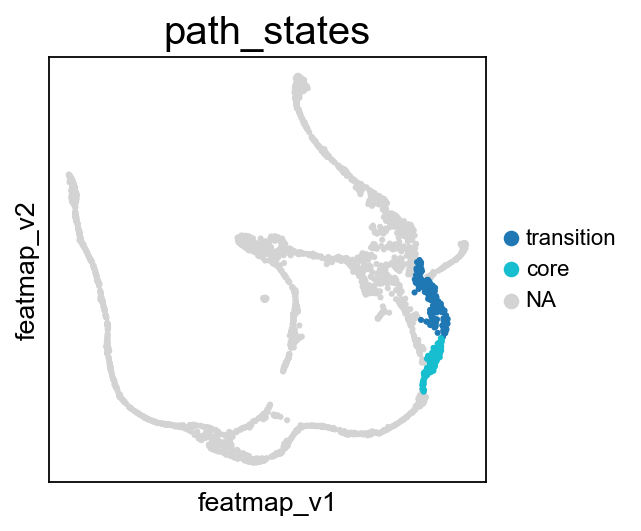

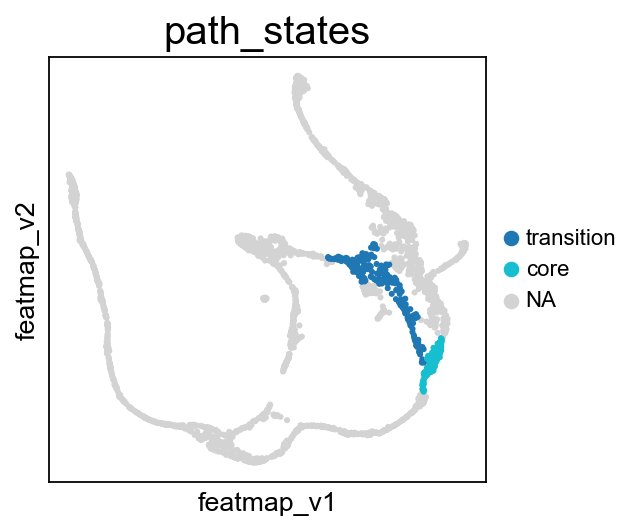

In [30]:

# During the bifurcation, select the core states and transition states by leiiden clustering
core_states = [4,]
transition_states_1 = [25,1,]

transition_states_2 = [14, 17, 8]

from featuremap import core_transition_states
import importlib
importlib.reload(core_transition_states)

core_transition_states.bifurcation_plot(adata, core_states, transition_states_1, transition_states_2)
core_transition_states.path_plot(adata, core_states, transition_states_1)
core_transition_states.path_plot(adata, core_states, transition_states_2)


From Fev+ cells to Alpha cells, compare the transition and core states in terms of density, curvature and betweenness centrality.

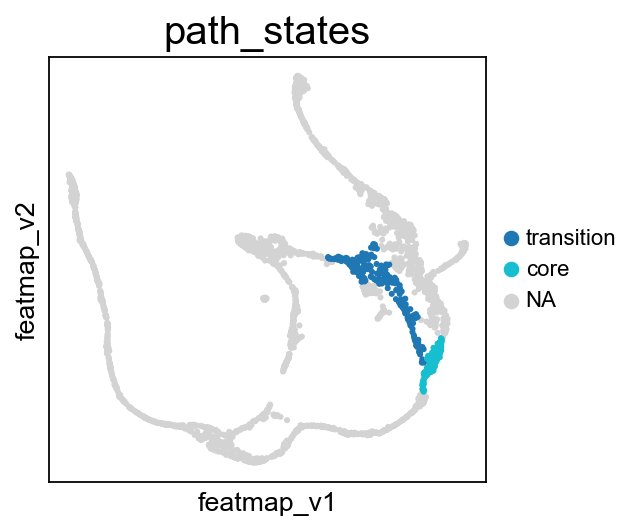

T-test p-value for core states and transition states_1: 9.114542500712631e-102


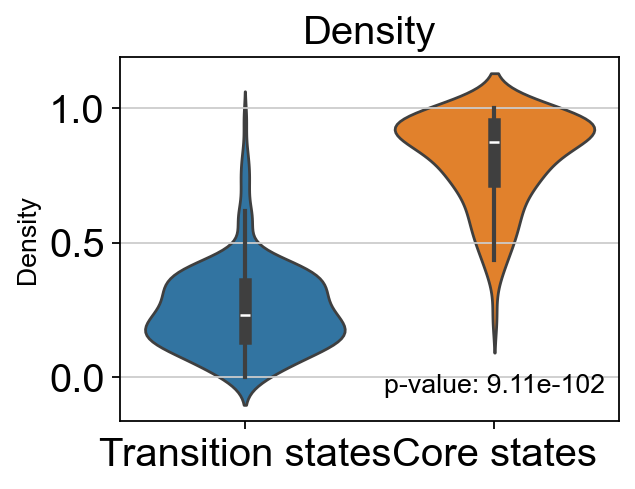

T-test p-value for core states and transition states_1: 7.409138824101513e-50


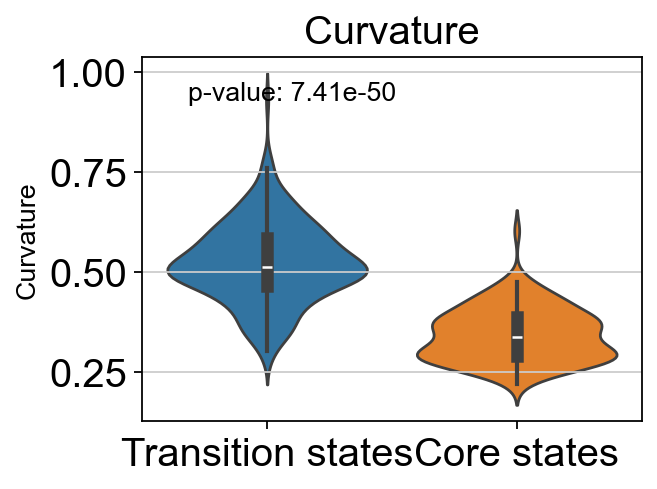

T-test p-value for core states and transition states_1: 2.6137322490087515e-16


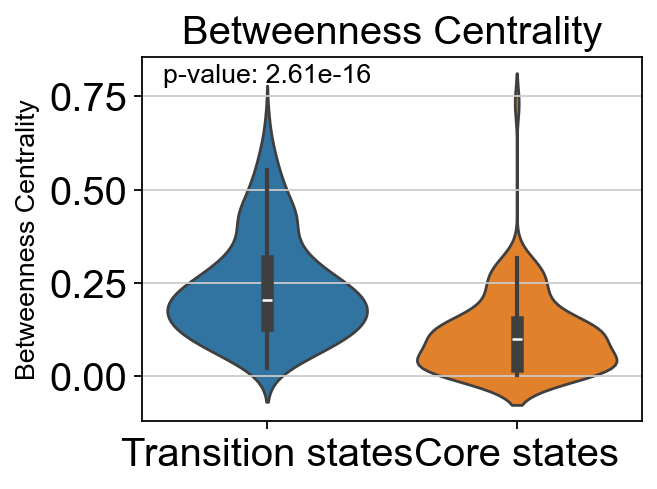

In [31]:

from featuremap import core_transition_states
import importlib
importlib.reload(core_transition_states)

core_transition_states.path_plot(adata, core_states, transition_states_2)

# violin plot to show the density, curvature, and betweenness centrality of core states and transition states
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt

# t-test for the density of core states and transition states_1
p_val_density = stats.ttest_ind(adata.obs[adata.obs['path_states']=='core']['density'],
                adata.obs[adata.obs['path_states']=='transition']['density'])[1]
print(f'T-test p-value for core states and transition states_1: {p_val_density}')

# Plot the density violin plot
plt.figure(figsize=(4, 3))
sns.violinplot(x='path_states', y='density', data=adata.obs, hue='path_states')
plt.xticks(ticks=[0, 1], labels=['Transition states', 'Core states'])
plt.title('Density')
plt.xlabel('')
plt.ylabel('Density')
# no legend
plt.legend().remove()
# add p-value to the plot
plt.text(0.75, 0.1, f'p-value: {p_val_density:.2e}', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
plt.show()

# t-test for the curvature of core states and transition states_1
p_val_curvature = stats.ttest_ind(adata.obs[adata.obs['path_states']=='core']['curvature'],
                adata.obs[adata.obs['path_states']=='transition']['curvature'])[1]
print(f'T-test p-value for core states and transition states_1: {p_val_curvature}')

# Plot the curvature violin plot
plt.figure(figsize=(4, 3))
sns.violinplot(x='path_states', y='curvature', data=adata.obs, hue='path_states')
plt.xticks(ticks=[0, 1], labels=['Transition states', 'Core states'])
plt.title('Curvature')
plt.xlabel('')
plt.ylabel('Curvature')
# no legend
plt.legend().remove()
# add p-value to the plot
plt.text(0.3, 0.9, f'p-value: {p_val_curvature:.2e}', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)


plt.show()

# t-test for the betweenness centrality of core states and transition states_1
p_val_bc = stats.ttest_ind(adata.obs[adata.obs['path_states']=='core']['betweenness_centrality'],
                adata.obs[adata.obs['path_states']=='transition']['betweenness_centrality'])[1]
print(f'T-test p-value for core states and transition states_1: {p_val_bc}')

# Plot the betweenness centrality violin plot
plt.figure(figsize=(4, 3))
sns.violinplot(x='path_states', y='betweenness_centrality', data=adata.obs, hue='path_states')
plt.xticks(ticks=[0, 1], labels=['Transition states', 'Core states'])
plt.title('Betweenness Centrality')
plt.xlabel('')
plt.ylabel('Betweenness Centrality')
# no legend
plt.legend().remove()
# add p-value to the plot
plt.text(0.25, 0.95, f'p-value: {p_val_bc:.2e}', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)

plt.show()


From Fev+ cells to Beta cells, compare the transition and core states in terms of density, curvature and betweenness centrality.

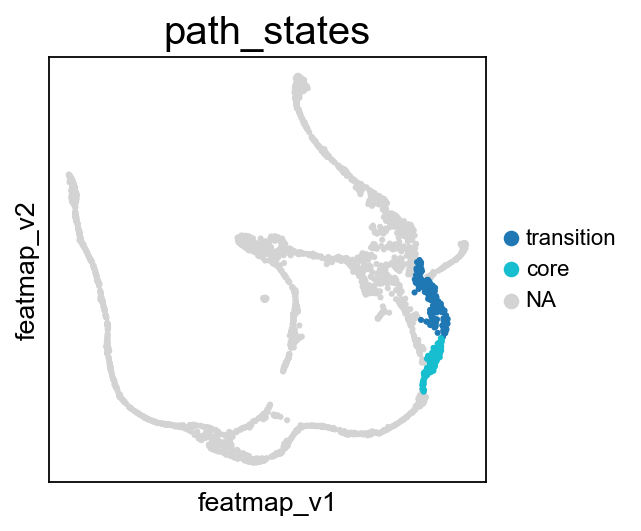

T-test p-value for core states and transition states_1: 5.164048705079924e-27


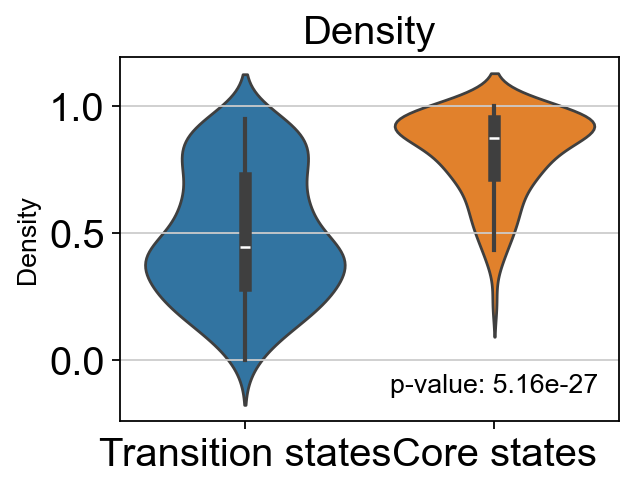

T-test p-value for core states and transition states_1: 5.899022529722048e-20


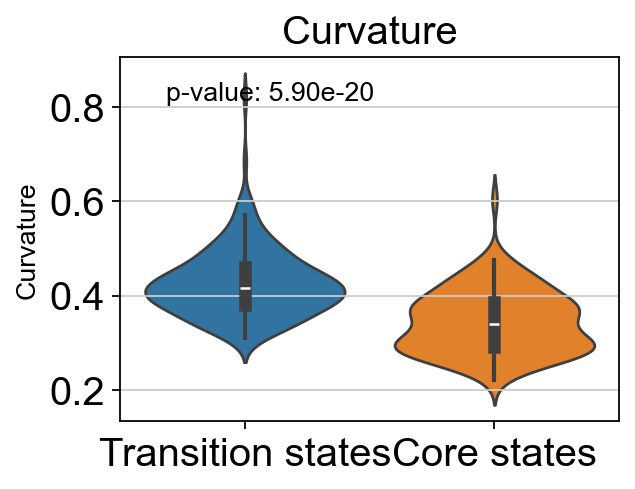

T-test p-value for core states and transition states_1: 0.10834991168537482


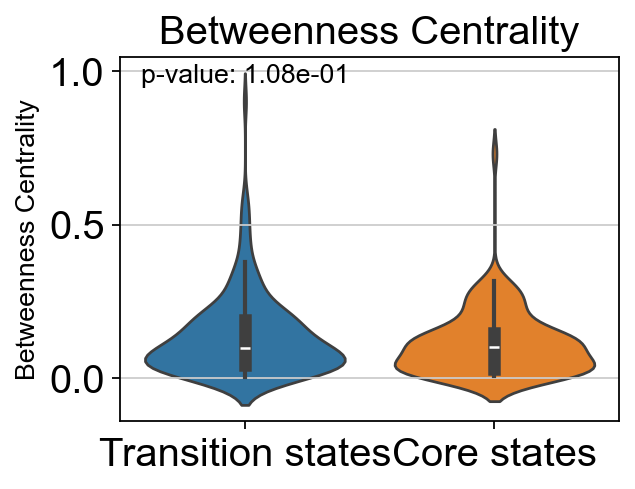

In [32]:
core_transition_states.path_plot(adata, core_states, transition_states_1)

# violin plot to show the density, curvature, and betweenness centrality of core states and transition states
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt

# t-test for the density of core states and transition states_1
p_val_density = stats.ttest_ind(adata.obs[adata.obs['path_states']=='core']['density'],
                adata.obs[adata.obs['path_states']=='transition']['density'])[1]
print(f'T-test p-value for core states and transition states_1: {p_val_density}')

# Plot the density violin plot
plt.figure(figsize=(4, 3))
sns.violinplot(x='path_states', y='density', data=adata.obs, hue='path_states')
plt.xticks(ticks=[0, 1], labels=['Transition states', 'Core states'])
plt.title('Density')
plt.xlabel('')
plt.ylabel('Density')
# no legend
plt.legend().remove()
# add p-value to the plot
plt.text(0.75, 0.1, f'p-value: {p_val_density:.2e}', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
plt.show()

# t-test for the curvature of core states and transition states_1
p_val_curvature = stats.ttest_ind(adata.obs[adata.obs['path_states']=='core']['curvature'],
                adata.obs[adata.obs['path_states']=='transition']['curvature'])[1]
print(f'T-test p-value for core states and transition states_1: {p_val_curvature}')

# Plot the curvature violin plot
plt.figure(figsize=(4, 3))
sns.violinplot(x='path_states', y='curvature', data=adata.obs, hue='path_states')
plt.xticks(ticks=[0, 1], labels=['Transition states', 'Core states'])
plt.title('Curvature')
plt.xlabel('')
plt.ylabel('Curvature')
# no legend
plt.legend().remove()
# add p-value to the plot
plt.text(0.3, 0.9, f'p-value: {p_val_curvature:.2e}', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)


plt.show()

# t-test for the betweenness centrality of core states and transition states_1
p_val_bc = stats.ttest_ind(adata.obs[adata.obs['path_states']=='core']['betweenness_centrality'],
                adata.obs[adata.obs['path_states']=='transition']['betweenness_centrality'])[1]
print(f'T-test p-value for core states and transition states_1: {p_val_bc}')

# Plot the betweenness centrality violin plot
plt.figure(figsize=(4, 3))
sns.violinplot(x='path_states', y='betweenness_centrality', data=adata.obs, hue='path_states')
plt.xticks(ticks=[0, 1], labels=['Transition states', 'Core states'])
plt.title('Betweenness Centrality')
plt.xlabel('')
plt.ylabel('Betweenness Centrality')
# no legend
plt.legend().remove()
# add p-value to the plot
plt.text(0.25, 0.95, f'p-value: {p_val_bc:.2e}', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)

plt.show()



##### Differential Gene Variation Analysis

DPT pseudotime.

In [33]:
# set the root cell
sc.pp.neighbors(adata, n_neighbors=15)
sc.tl.diffmap(adata)
adata.uns['iroot'] = np.where(adata.obs['clusters'] == 'Ngn3 low EP')[0][0]
sc.tl.dpt(adata)

         Falling back to preprocessing with `sc.pp.pca` and default params.


Preprocessing gene variation.

In [34]:
importlib.reload(featuremap_)
from featuremap.features import feature_variation, feature_variation_embedding
feature_variation(adata, threshold=0.9)

adata_var = features.variation_feature_pp(adata)

adata.layers['variation_feature_processed'] = adata_var.layers['var_filter'].copy()


k is 14
Start matrix multiplication
Finish matrix multiplication in 5.291463136672974
Finish norm calculation in 0.22771596908569336


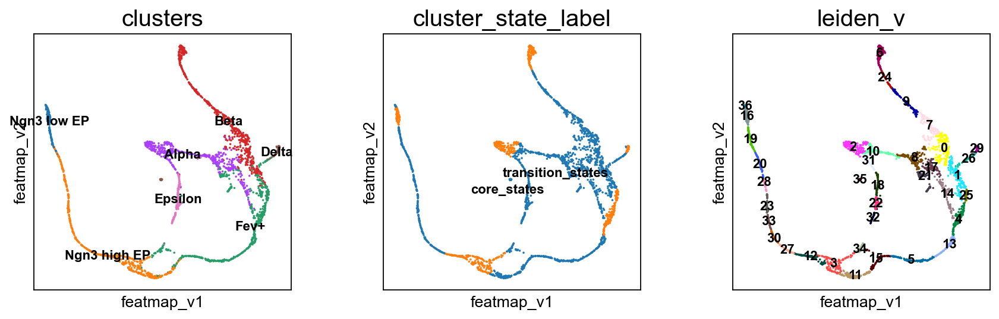

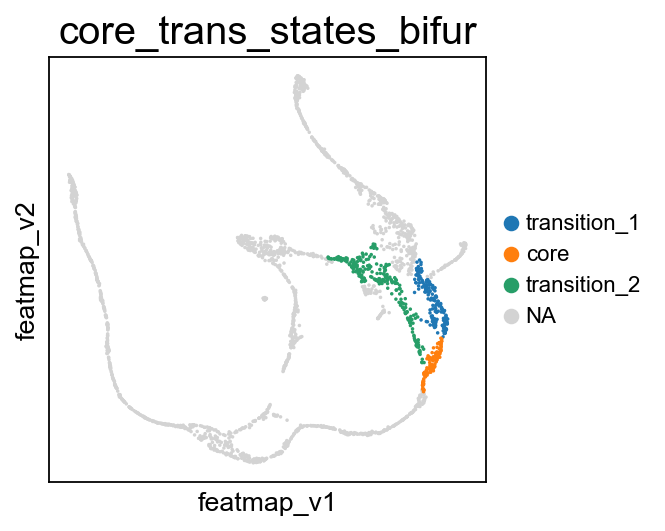

In [36]:
sc.pl.embedding(adata, 'featmap_v',legend_fontsize=10, s=10, legend_loc='on data', 
                color=['clusters','cluster_state_label', 'leiden_v'])

core_transition_states.bifurcation_plot(adata, core_states, transition_states_1, transition_states_2)

# core_transition_states.path_plot(adata, core_states, transition_states_1)



FeatureMAP DGV analysis reveals the lineage gene Arx towards Alpha cell differentition.

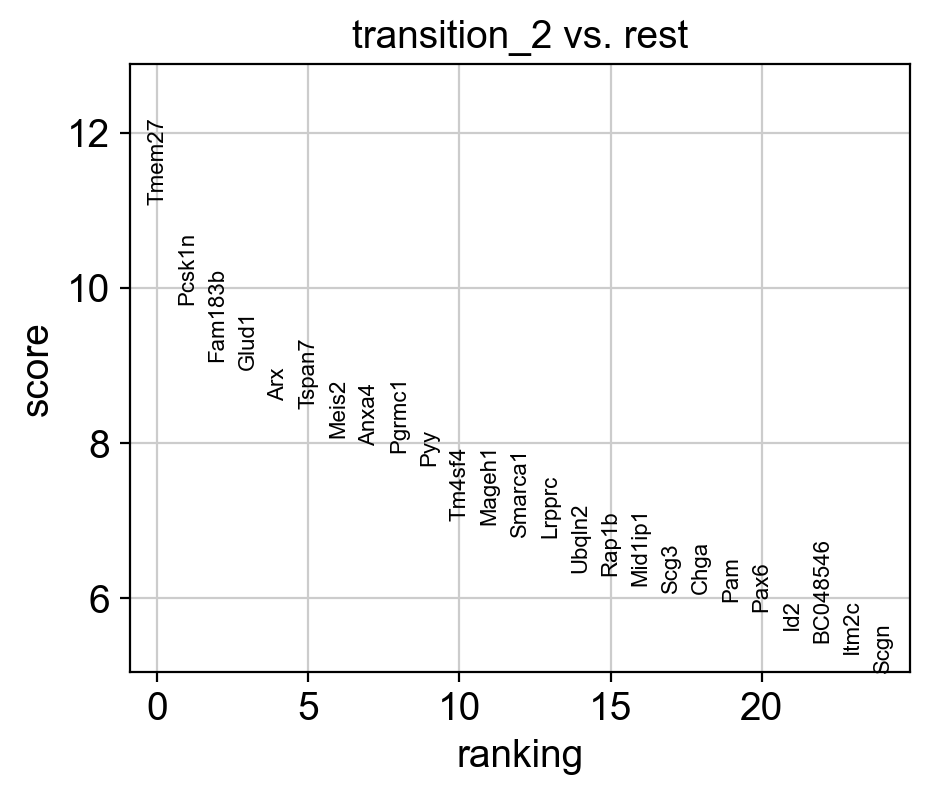

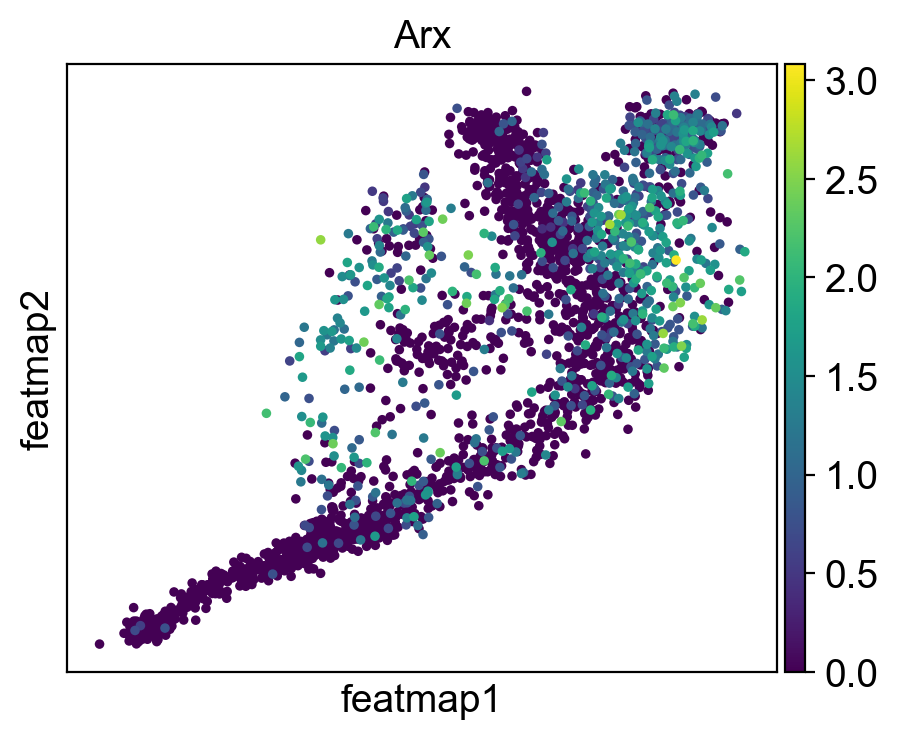

Rank of Arx is  [4] in transition_1
Start matrix multiplication
Finish matrix multiplication in 0.05005478858947754
pcVals_project_back_feature: (2531, 2, 1)
gauge_vh_emb: (2531, 2, 2)


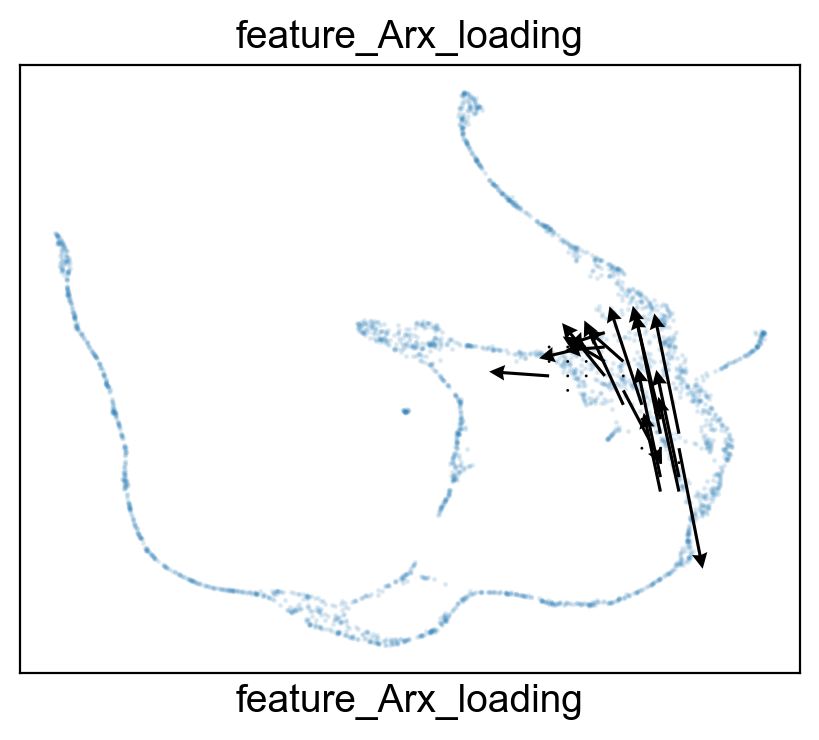

In [37]:
sc.set_figure_params(figsize=(5, 4),dpi=100)

sc.tl.rank_genes_groups(adata_var, 'core_trans_states_bifur', groups=['transition_2'],  method='wilcoxon', use_raw=False, layer='var_filter')
sc.pl.rank_genes_groups(adata_var, n_genes=25, sharey=False)
# Top 5 genes in rank_genes_groups
top_genes = adata_var.uns['rank_genes_groups']['names']['transition_2'][:5]


gene = 'Arx'
sc.pl.embedding(adata, 'featmap' ,color=[gene],)
rank = np.where(adata_var.uns['rank_genes_groups']['names']['transition_2'] == gene)[0]
print(f'Rank of {gene} is  {rank} in transition_1')


from featuremap import features

import importlib
importlib.reload(features)

features.feature_projection(adata, feature=gene, vkey='VH_embedding')
features.feature_variation_one_feature(adata, feature=gene)
features.plot_one_feature(adata, feature=gene, ratio=0.5, density=0.8, embedding='X_featmap_v',
                               pseudotime='feat_pseudotime', pseudotime_adjusted=True, cluster_key='core_trans_states_bifur',
                               plot_within_cluster=['transition_2']
                               )    


FeatureMAP DGV reveals the lineage gene Pdx1 towards Beta cell differentition.

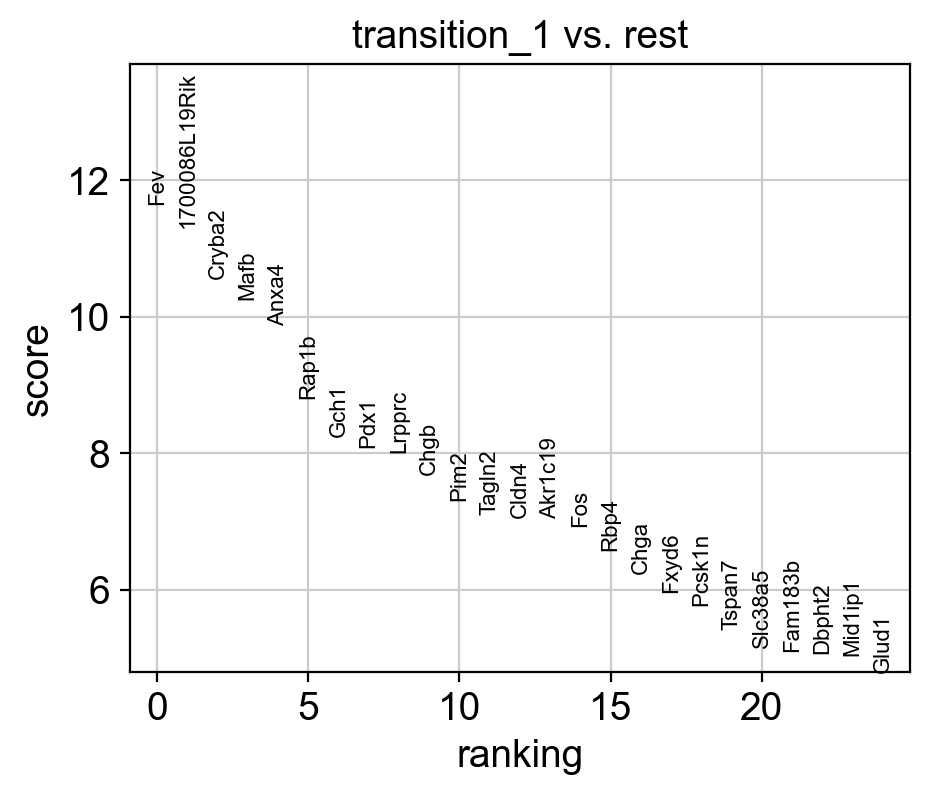

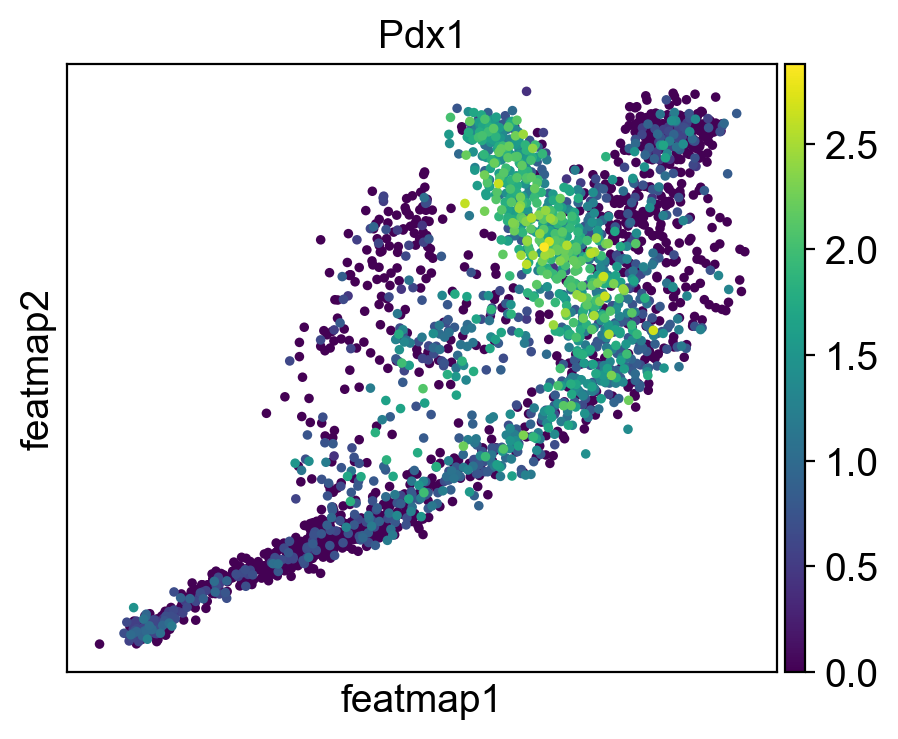

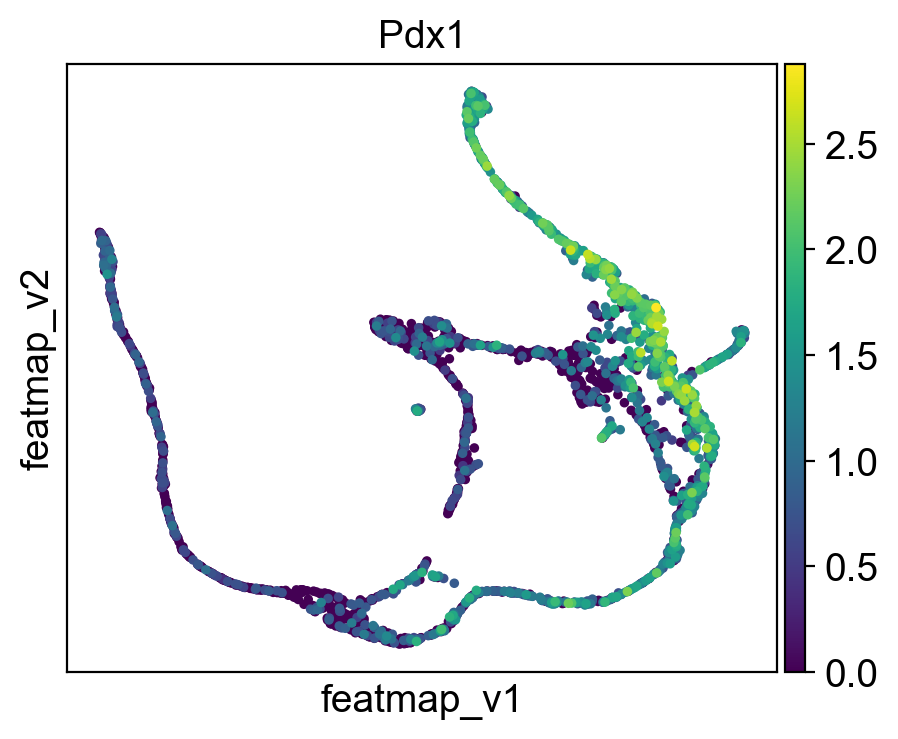

Rank of Pdx1 is  [7] in transition_1
Start matrix multiplication
Finish matrix multiplication in 0.015163898468017578
pcVals_project_back_feature: (2531, 2, 1)
gauge_vh_emb: (2531, 2, 2)


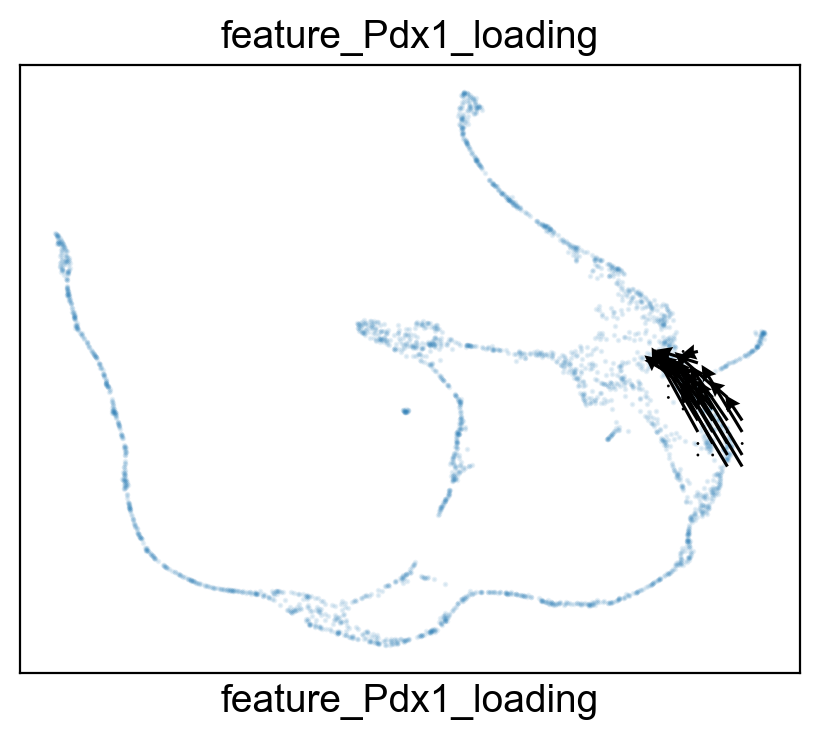

In [38]:
# set figure size
sc.set_figure_params(figsize=(5,4),dpi=100)


sc.tl.rank_genes_groups(adata_var, 'core_trans_states_bifur', groups=['transition_1'],  method='wilcoxon', use_raw=False, layer='var_filter')
sc.pl.rank_genes_groups(adata_var, n_genes=25, sharey=False, fontsize=8)
# Top 5 genes in rank_genes_groups
top_genes = adata_var.uns['rank_genes_groups']['names']['transition_1'][:5]


gene = 'Pdx1'
sc.pl.embedding(adata, 'featmap' ,color=[gene],)
sc.pl.embedding(adata, 'featmap_v' ,color=[gene],)
rank = np.where(adata_var.uns['rank_genes_groups']['names']['transition_1'] == gene)[0]
print(f'Rank of {gene} is  {rank} in transition_1')


from featuremap import features
import importlib
importlib.reload(features)


features.feature_projection(adata, feature=gene, vkey='VH_embedding')
features.feature_variation_one_feature(adata, feature=gene)
features.plot_one_feature(adata, feature=gene, ratio=0.3, density=1, embedding='X_featmap_v',
                               pseudotime='feat_pseudotime', pseudotime_adjusted=True, cluster_key='core_trans_states_bifur',
                               plot_within_cluster=['transition_1']
                               )    



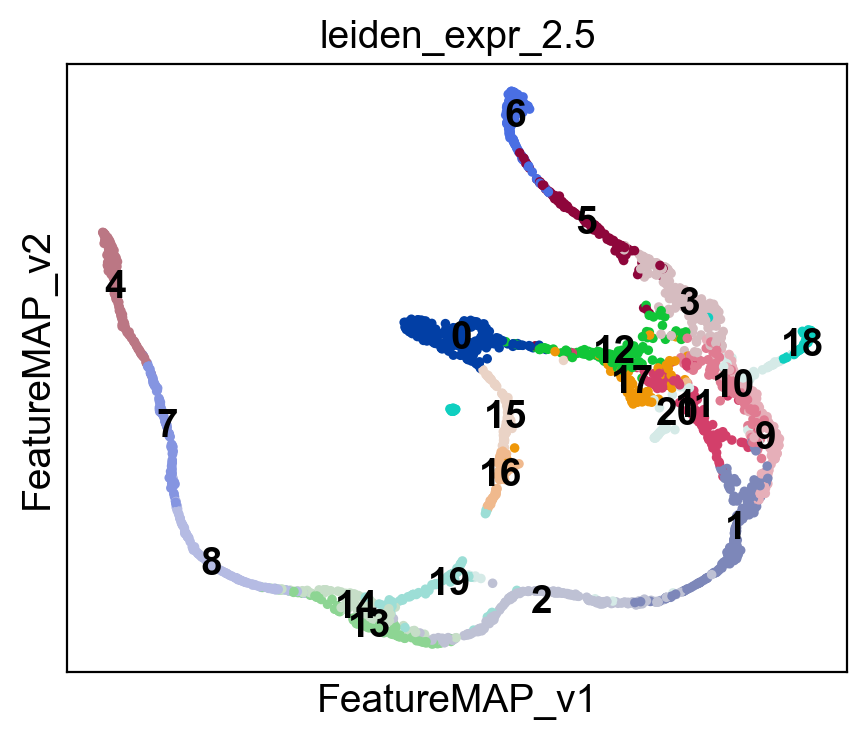

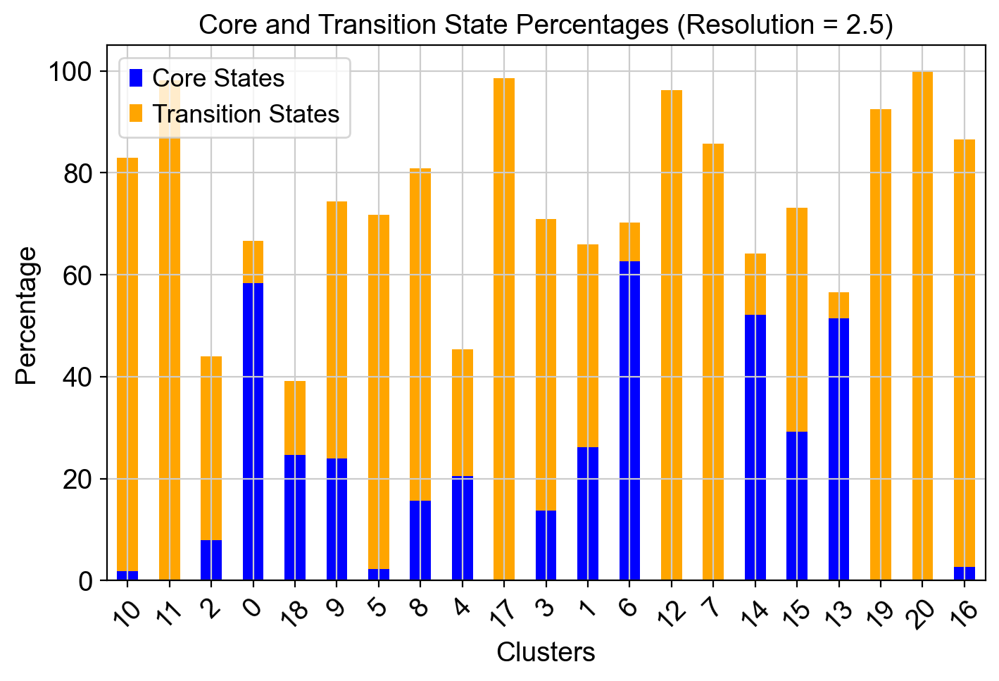

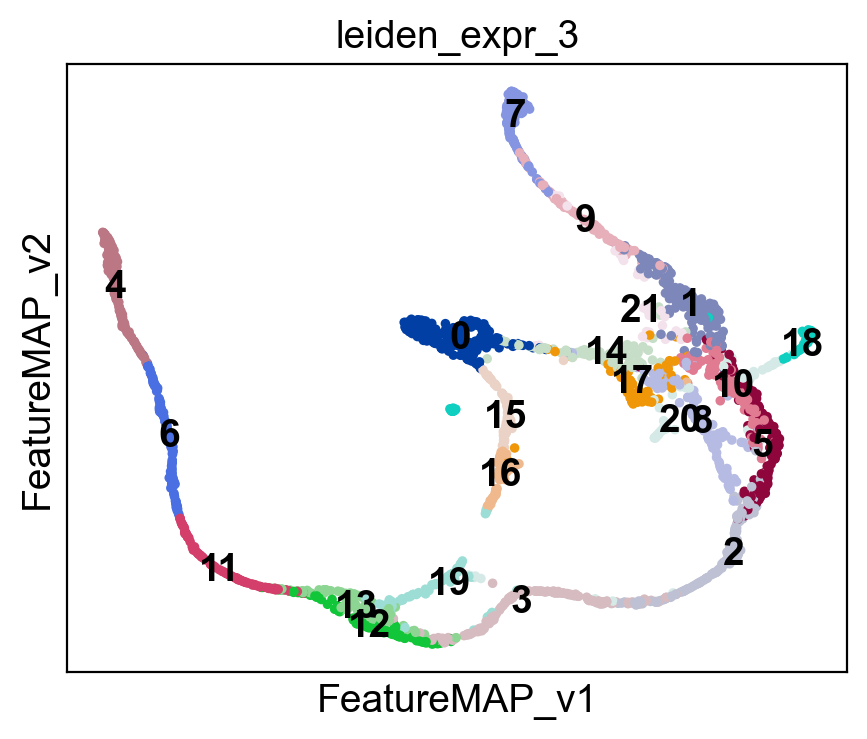

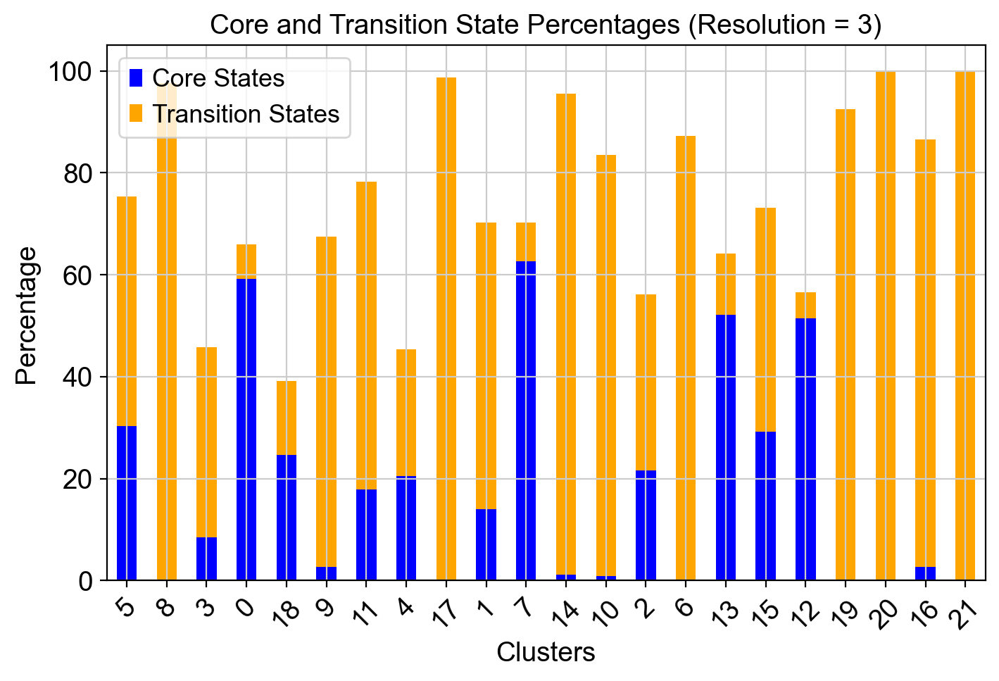

In [40]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt

# Define resolutions
resolutions = [2.5, 3]

# Dictionaries to store core and transition state percentages
core_states_percentage_dict = {}
transition_states_percentage_dict = {}

for res in resolutions:
    # Perform Leiden clustering for the given resolution
    leiden_key = f'leiden_expr_{res}'
    sc.tl.leiden(adata, resolution=res, key_added=leiden_key) 

    # Visualize clusters on FeatureMAP embedding
    sc.pl.embedding(adata, basis='FeatureMAP_v', color=leiden_key, legend_loc='on data')

    # Initialize storage for cluster-wise percentages
    core_states_percentage = []
    transition_states_percentage = []

    # Compute cluster-wise percentages
    clusters = adata.obs[leiden_key].unique()
    for cluster in clusters:
        cluster_cells = adata.obs[leiden_key] == cluster
        total_cells = cluster_cells.sum()

        core_cells = (adata.obs['core_states']=='1') & cluster_cells
        transition_cells = (adata.obs['transition_states']=='1') & cluster_cells

        core_percentage = (core_cells.sum() / total_cells) * 100
        transition_percentage = (transition_cells.sum() / total_cells) * 100

        core_states_percentage.append(core_percentage)
        transition_states_percentage.append(transition_percentage)

    # Store results in dictionaries
    core_states_percentage_dict[res] = core_states_percentage
    transition_states_percentage_dict[res] = transition_states_percentage

    # Convert to DataFrame for plotting
    df = pd.DataFrame({
        "Cluster": clusters,
        "Core States (%)": core_states_percentage,
        "Transition States (%)": transition_states_percentage
    })

    # Plot for the current resolution
    fig, ax = plt.subplots(figsize=(8, 5))
    df.set_index("Cluster").plot(kind="bar", stacked=True, ax=ax, color=["blue", "orange"])

    ax.set_xlabel("Clusters")
    ax.set_ylabel("Percentage")
    ax.set_title(f"Core and Transition State Percentages (Resolution = {res})")
    ax.legend(["Core States", "Transition States"])

    plt.xticks(rotation=45)
    plt.show()
